>[Country-Ingredient Network Analysis](#country-ingredient-network-analysis)

>>[Introduction](#introduction)

>>[Data collection and Preprocessing](#data-collection-and-preprocessing)

>>>>[Data Source and Scope](#data-source-and-scope)

>>>>[Web Scraping Workflow](#web-scraping-workflow)

>>>>[Initial Dataset](#initial-dataset)

>>>>[Data Cleaning and Normalisation](#data-cleaning-and-normalisation)

>>>>[Final Dataset](#final-dataset)

>>>>[NLP Data Extraction](#nlp-data-extraction)

>>[Data loading](#data-loading)

>>[Creating bipartite graph](#creating-bipartite-graph)

>>[Basic network properties](#basic-network-properties)

>>>[Degree distribution](#degree-distribution)

>>>[Degree centrality](#degree-centrality)

>>>[Betweenness centrality](#betweenness-centrality)

>>>[Eigenvector centrality](#eigenvector-centrality)

>>>[Assortativity analysis](#assortativity-analysis)

>>>[Network backbone visualization](#network-backbone-visualization)

>>[Jaccard and cosine similarity](#jaccard-and-cosine-similarity)

>>>[Basic network properties summary](#basic-network-properties-summary)

>>[Louvain communities](#louvain-communities)

>>>[Louvain communities on unfiltered data](#louvain-communities-on-unfiltered-data)

>>>[Louvain communities on filtered data](#louvain-communities-on-filtered-data)

>>[Colonization as a factor](#colonization-as-a-factor)

>>>[Jaccard and cosine similarity](#jaccard-and-cosine-similarity-1)

>>>[Ingredient Composition by Colonial Empire](#ingredient-composition-by-colonial-empire)

>>>[Ingredient Prevalence by Colonial Empire](#ingredient-prevalence-by-colonial-empire)

>>>[Empire vs Louvain communities map](#empire-vs-louvain-communities-map)

>>>>[Interpretation of the Colonial Empire Map vs. Culinary Similarity Communities](#interpretation-of-the-colonial-empire-map-vs-culinary-similarity-communities)

>>>[Ingredient-Ingredient projection](#ingredient-ingredient-projection)

>>>>[TOP 60 Ingredients Network](#top-60-ingredients-network)

>>>>[TOP 100 Ingredients Network](#top-100-ingredients-network)

>>>>[BACKBONE Network](#backbone-network)

>>>[Rare ingredients](#rare-ingredients)

>>>>[Rare ingredients network](#rare-ingredients-network)

>>>>[Linking rare-ingredient clusters to country communities](#linking-rare-ingredient-clusters-to-country-communities)

>[NLP](#nlp)

>>[Creating word clouds for each community](#creating-word-clouds-for-each-community)

>>[Creating word clouds for each community – TF-IDF](#creating-word-clouds-for-each-community--tf-idf)

>>[Colonial Language Frequency Analysis](#colonial-language-frequency-analysis)

>>[Sentiment Analysis of Colonial Culinary Narratives](#sentiment-analysis-of-colonial-culinary-narratives)

>[Use of AI in the project](#use-of-ai-in-the-project)

>[Contribution Table](#contribution-table)


# Country-Ingredient Network Analysis

## Introduciton

This is an explainer notebook created for the purpose of the final project in the course Social Graphs and Interactions 2025.

In this notebook we analyze national dishes retrieved from Wikipedia and try to see what are the driving forces in ingredient communities.

Group members:
- Tomasz Gabriel Stepien - s243062
- Antonela Garavaglia - s243493
- Nazareno Jose Rudi - s242867


## Data collection and Preprocessing

#### Data Source and Scope

Our dataset is based on the Wikipedia page National Dish (https://en.wikipedia.org/wiki/National_dish), which lists national or emblematic dishes associated with countries and regions worldwide. We used this page as our starting scope and scraped all country–dish pairs listed, without imposing any restrictions. Because Wikipedia includes both sovereign states and subnational entities, some regions (e.g., England, Scotland, Catalonia, Valencia) initially appeared as independent “countries” in the raw data.

#### Web Scraping Workflow

**Step 1 — Extract country–dish pairs**
From the National Dish page, we collected every listed dish for every listed entity. A country could appear multiple times depending on how many national dishes were associated with it, producing entries such as:
- Argentina - Asado
- Argentina - Empanada
- Argentina - Locro

This initial pass produced a broad dataset containing all entries present on Wikipedia, including duplicates, subnational entities, and alternative names.

**Step 2 — Extract ingredient lists for each dish**
For each national dish obtained in Step 1, we scraped the corresponding Wikipedia article to extract ingredients. When available, ingredients were taken from:

1. the infobox (if it included a structured ingredient list),
2. the “Ingredients” section of the article, or
3. the full article text when no explicit section existed.

This approach maximized completeness but produced heterogeneous and sometimes noisy ingredient lists.

#### Initial Dataset

After these two steps, we obtained a raw table with three columns:

- country
- national dish
- ingredient

accompanied by metadata linking each ingredient back to its dish and country of origin.

The raw extraction produced roughly:

- ≈180 country-like entities (countries + regions as listed on Wikipedia)
- ≈400 distinct national dishes
- ≈850 raw, unnormalized ingredients

This dataset was rich but required extensive cleaning.

#### Data Cleaning and Normalisation

**Country Standardisation**

Wikipedia’s list includes many subnational units. To ensure a consistent country definition:

- England, Scotland, and Northern Ireland were merged into United Kingdom.
- Catalonia, Valencia, and other Spanish regions were merged into Spain.
- Minor corrections were applied to unify country naming across all entries (some islans or regions belonging to united States like Hawai, Alaska, Virgin Islands were also merged)

**Dish Name Corrections**

Several dish names contained encoding errors or special characters (e.g., smørrebrød) that caused inconsistencies.
We corrected approximately 50 such cases and enforced a clean, uniform naming convention so each dish appeared only once.

**Ingredient Normalisation**

Raw ingredient strings included preparation words (e.g., chopped, minced, warm), descriptors, plurals, and region-specific naming variants.

To normalise ingredients, we:

- lowercased all tokens and removed punctuation,
- stripped preparation descriptors (e.g., chopped, sliced, grated),
- harmonised singular/plural forms,
- collapsed variants of the same item (e.g., chicken legs → chicken),
- removed non-ingredient terms (e.g., stock, sauce, garnish),
- resolved synonym or near-duplicate ingredients manually,
- performed multiple manual review passes to catch edge cases the code could not standardise (like chili and chillie).

This multi-step process substantially reduced noise and produced a consistent vocabulary of ingredients.

#### Final Dataset

After all cleaning and consolidation steps, the final dataset contains:

- 146 countries
- 363 national dishes
- 440 unique normalised ingredients
- 2051 country–dish–ingredient records

This cleaned dataset is the foundation for all bipartite and projected network analyses in the notebook.

#### NLP Data Extraction

For text-based analysis, we extended the dataset by recording each dish’s canonical Wikipedia page path (e.g., wiki/Asado) and downloading the full article text into separate .txt files. This allowed us to perform NLP tasks such as keyword extraction and semantic mapping using the same underlying set of national dishes.

## Data loading

In [1]:
pip install geodatasets


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


We start by importing all the relevant libraries for the project.

In [2]:
import pandas as pd
import requests
from io import BytesIO
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities
from networkx.algorithms.community.quality import modularity
from community import community_louvain
import itertools
from collections import defaultdict
import math
from scipy.stats import mannwhitneyu
import seaborn as sns
import geopandas as gpd
import geodatasets
from itertools import combinations
from collections import Counter
from matplotlib import colormaps
from matplotlib.lines import Line2D
from io import StringIO
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
import re
from scipy import stats
import matplotlib.patches as mpatches

In [3]:
url = "https://raw.githubusercontent.com/s243062/social-graphs-and-interactions-final-project/main/FINAL_DATASET.xlsx"
response = requests.get(url)
df = pd.read_excel(BytesIO(response.content))
df.head()

,country,dish,ingredient,wiki_page_exact
0,Afghanistan,kabuli palaw,carrot,Kabuli_palaw
1,Afghanistan,kabuli palaw,lamb meat,Kabuli_palaw
2,Afghanistan,kabuli palaw,mutton,Kabuli_palaw
3,Afghanistan,kabuli palaw,nut,Kabuli_palaw
4,Afghanistan,kabuli palaw,raisin,Kabuli_palaw


## Creating bipartite graph

In [4]:
B = nx.Graph()
countries = df['country'].unique()
ingredients = df['ingredient'].unique()
B.add_nodes_from(countries, bipartite="country")
B.add_nodes_from(ingredients, bipartite="ingredient")
for _, row in df.iterrows():
    B.add_edge(row['country'], row['ingredient'])
len(B.nodes()), len(B.edges())

(586, 1745)

## Basic network properties

In [5]:
is_bip = nx.bipartite.is_bipartite(B)
country_nodes = {n for n, d in B.nodes(data=True) if d['bipartite']=="country"}
ingredient_nodes = set(B.nodes()) - country_nodes
print("Is bipartite?", is_bip)
print("Countries:", len(country_nodes))
print("Ingredients:", len(ingredient_nodes))
print("Edges (dish-ingredient pairs):", B.number_of_edges())

Is bipartite? True
Countries: 146
Ingredients: 440
Edges (dish-ingredient pairs): 1745


In [6]:
G_country = nx.bipartite.weighted_projected_graph(B, country_nodes)
print("Country–country graph:", G_country.number_of_nodes(), "nodes,", G_country.number_of_edges(), "edges")

Country–country graph: 146 nodes, 7258 edges


In [7]:
G_ing = nx.bipartite.weighted_projected_graph(B, ingredient_nodes)
print("Ingredient–ingredient graph:", G_ing.number_of_nodes(), "nodes,", G_ing.number_of_edges(), "edges")

Ingredient–ingredient graph: 440 nodes, 9322 edges


In [8]:
deg_country = {n: B.degree(n) for n in country_nodes}
deg_ing     = {n: B.degree(n) for n in ingredient_nodes}
def summarize_deg(deg_dict):
    vals = np.array(list(deg_dict.values()))
    return {
        "min": int(vals.min()),
        "max": int(vals.max()),
        "mean": float(vals.mean()),
        "median": float(np.median(vals))
    }
print("Country-degree summary (ingredients per country):")
print(summarize_deg(deg_country))
print("\nIngredient-degree summary (countries per ingredient):")
print(summarize_deg(deg_ing))

Country-degree summary (ingredients per country):
{'min': 1, 'max': 48, 'mean': 11.952054794520548, 'median': 9.5}

Ingredient-degree summary (countries per ingredient):
{'min': 1, 'max': 72, 'mean': 3.965909090909091, 'median': 1.0}


The bipartite network contains 146 countries and 440 ingredients connected by 1,745 dish-ingredient pairs. After projecting the bipartite graph, we get two one-mode networks: the country-country graph with 7,258 edges shows which countries share ingredients, while the ingredient-ingredient graph with 9,322 edges shows which ingredients co-occur in dishes. The degree summaries reveal interesting patterns - countries use between 1 and 48 ingredients (mean ~12, median 9.5), suggesting most countries have around 10 key ingredients in their representative dishes. Meanwhile, ingredients appear in 1 to 72 countries (mean ~4, median 1), indicating that most ingredients are country-specific while only a few are widely shared across many cuisines. This asymmetry makes sense because universal ingredients like salt, water, or oil would appear in many countries, while specialty ingredients remain regional.

### Degree distribution

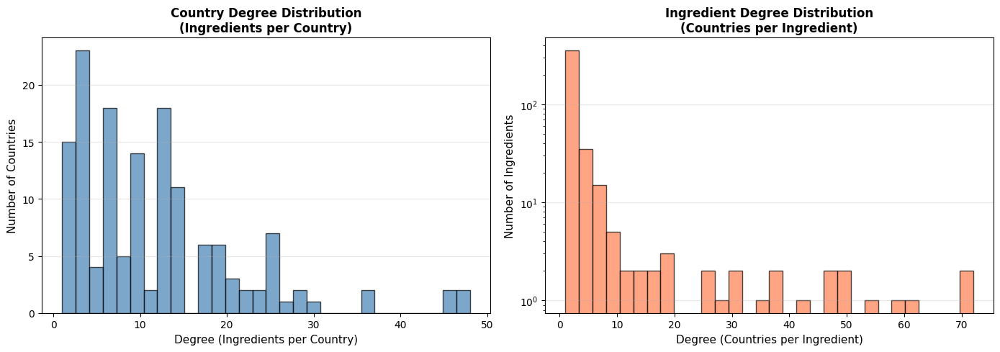

Country degrees - Min: 1, Max: 48, Mean: 11.95
Ingredient degrees - Min: 1, Max: 72, Mean: 3.97


In [9]:
country_degrees = list(deg_country.values())
ingredient_degrees = list(deg_ing.values())

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.hist(country_degrees, bins=30, color='steelblue', edgecolor='black', alpha=0.7)
ax1.set_xlabel('Degree (Ingredients per Country)', fontsize=11)
ax1.set_ylabel('Number of Countries', fontsize=11)
ax1.set_title('Country Degree Distribution\n(Ingredients per Country)', fontsize=12, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

ax2.hist(ingredient_degrees, bins=30, color='coral', edgecolor='black', alpha=0.7)
ax2.set_xlabel('Degree (Countries per Ingredient)', fontsize=11)
ax2.set_ylabel('Number of Ingredients', fontsize=11)
ax2.set_title('Ingredient Degree Distribution\n(Countries per Ingredient)', fontsize=12, fontweight='bold')
ax2.set_yscale('log')
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('bipartite_degree_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Country degrees - Min: {min(country_degrees)}, Max: {max(country_degrees)}, Mean: {np.mean(country_degrees):.2f}")
print(f"Ingredient degrees - Min: {min(ingredient_degrees)}, Max: {max(ingredient_degrees)}, Mean: {np.mean(ingredient_degrees):.2f}")

**Figure 1**. Degree Distribution in Bipartite Cuisine-Ingredient Network. The left panel shows the degree distribution of countries (number of ingredients used per cuisine). Most countries use between 2 and 20 ingredients, with a concentration around 3–5, while a few countries have substantially larger ingredient sets. The right panel displays the degree distribution of ingredients (number of countries in which each ingredient appears), plotted on a logarithmic y-axis to reveal its heavy-tailed structure. Most ingredients occur in only one or two countries, while a small number function as global hubs, appearing in dozens of cuisines. The log scale highlights the rapid decay in ingredient popularity and the presence of a long tail of widely shared ingredients, a pattern characteristic of heterogeneous and scale-free networks.


### Degree centrality

Degree centrality measures the number of direct connections a node has in a network, essentially counting how many other nodes it is directly linked to. In a bipartite network like ours, it indicates how many ingredients each country uses (for country nodes) or how many countries share each ingredient (for ingredient nodes), with normalized scores ranging from 0 to 1 to allow comparison across different network sizes. It's the simplest centrality measure and identifies the most directly connected or "popular" nodes in the network.

In [10]:
degree_centrality_B = nx.degree_centrality(B)
centrality_country = {n: degree_centrality_B[n] for n in country_nodes}
centrality_ingredient = {n: degree_centrality_B[n] for n in ingredient_nodes}
top_countries = sorted(centrality_country.items(), key=lambda x: x[1], reverse=True)[:10]
top_ingredients = sorted(centrality_ingredient.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 countries by degree centrality:")
for country, cent in top_countries:
    print(f"  {country}: {cent:.4f}")
print("\nTop 10 ingredients by degree centrality:")
for ingredient, cent in top_ingredients:
    print(f"  {ingredient}: {cent:.4f}")
print(f"\nCountry centrality - Min: {min(centrality_country.values()):.4f}, Max: {max(centrality_country.values()):.4f}")
print(f"Ingredient centrality - Min: {min(centrality_ingredient.values()):.4f}, Max: {max(centrality_ingredient.values()):.4f}")

Top 10 countries by degree centrality:
  United States: 0.0821
  Russia: 0.0803
  China: 0.0786
  United Kingdom: 0.0769
  France: 0.0615
  Slovenia: 0.0615
  Belgium: 0.0513
  Ukraine: 0.0496
  Turkey: 0.0479
  Sweden: 0.0462

Top 10 ingredients by degree centrality:
  onion: 0.1231
  meat: 0.1197
  beef: 0.1043
  chicken: 0.1009
  rice: 0.0940
  garlic: 0.0855
  pork: 0.0838
  tomato: 0.0821
  egg: 0.0803
  potato: 0.0718

Country centrality - Min: 0.0017, Max: 0.0821
Ingredient centrality - Min: 0.0017, Max: 0.1231


The degree centrality results show that the United States (0.0821), Russia (0.0803), and China (0.0786) have the most diverse ingredient profiles in the network. Country centrality scores are relatively similar (ranging from 0.046 to 0.082), indicating balanced ingredient diversity across major cuisines. For ingredients, onion dominates as the most central (0.1231), followed by other staple ingredients like meat (0.1197), beef (0.1043), chicken (0.1009), and rice (0.0940). The wider range of ingredient centrality (0.0017 to 0.1231) compared to country centrality confirms that while most ingredients are cuisine-specific, a few fundamental ingredients like onion, meat, and garlic act as universal hubs connecting cuisines worldwide.

### Betweeness centrality

The betweenness centrality results show which countries and ingredients act as "bridges" connecting different parts of the culinary network.

In [11]:
betweenness_centrality_B = nx.betweenness_centrality(B)
betweenness_country = {n: betweenness_centrality_B[n] for n in country_nodes}
betweenness_ingredient = {n: betweenness_centrality_B[n] for n in ingredient_nodes}
top_countries_btw = sorted(betweenness_country.items(), key=lambda x: x[1], reverse=True)[:10]
top_ingredients_btw = sorted(betweenness_ingredient.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 countries by betweenness centrality:")
for country, btw in top_countries_btw:
    print(f"  {country}: {btw:.6f}")
print("\nTop 10 ingredients by betweenness centrality:")
for ingredient, btw in top_ingredients_btw:
    print(f"  {ingredient}: {btw:.6f}")
print(f"\nCountry betweenness - Min: {min(betweenness_country.values()):.6f}, Max: {max(betweenness_country.values()):.6f}")
print(f"Ingredient betweenness - Min: {min(betweenness_ingredient.values()):.6f}, Max: {max(betweenness_ingredient.values()):.6f}")


Top 10 countries by betweenness centrality:
  United Kingdom: 0.065083
  United States: 0.060976
  China: 0.048717
  Russia: 0.048458
  France: 0.047202
  Belgium: 0.036351
  Greece: 0.035502
  Sweden: 0.033199
  Turkey: 0.031603
  Israel: 0.031411

Top 10 ingredients by betweenness centrality:
  onion: 0.122965
  meat: 0.091198
  beef: 0.080156
  chicken: 0.071911
  tomato: 0.065086
  rice: 0.058699
  garlic: 0.056811
  pork: 0.054980
  egg: 0.049096
  potato: 0.046583

Country betweenness - Min: 0.000000, Max: 0.065083
Ingredient betweenness - Min: 0.000000, Max: 0.122965


The United Kingdom ranks highest (0.065), followed by the United States (0.061) and China (0.049), suggesting these cuisines play key roles in connecting different culinary traditions through shared ingredients. It's interesting that the UK tops betweenness despite not having the highest degree centrality, indicating it bridges more diverse ingredient groups. France, Belgium, Greece, Sweden, Turkey, and Israel round out the top 10, all with scores between 0.031 and 0.047.​

For ingredients, onion again dominates with the highest betweenness (0.123), nearly double the next ingredient, confirming its role as a critical connector across cuisines. Meat (0.091), beef (0.080), chicken (0.072), and tomato (0.065) follow as important bridge ingredients. The top ingredients list is almost identical to the degree centrality ranking, which makes sense since highly connected ingredients naturally appear on more shortest paths. However, ingredient betweenness scores (max 0.123) are notably higher than country scores (max 0.065), suggesting ingredients play a more crucial bridging role in connecting the network than countries do.

### Eigenvector centrality

The eigenvector centrality results reveal which countries and ingredients are not just well-connected, but connected to other important nodes in the network.

In [12]:
eigenvector_centrality_B = nx.eigenvector_centrality(B, max_iter=1000)
eigenvector_country = {n: eigenvector_centrality_B[n] for n in country_nodes}
eigenvector_ingredient = {n: eigenvector_centrality_B[n] for n in ingredient_nodes}
top_countries_eig = sorted(eigenvector_country.items(), key=lambda x: x[1], reverse=True)[:10]
top_ingredients_eig = sorted(eigenvector_ingredient.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 countries by eigenvector centrality:")
for country, eig in top_countries_eig:
    print(f"  {country}: {eig:.6f}")
print("\nTop 10 ingredients by eigenvector centrality:")
for ingredient, eig in top_ingredients_eig:
    print(f"  {ingredient}: {eig:.6f}")
print(f"\nCountry eigenvector - Min: {min(eigenvector_country.values()):.6f}, Max: {max(eigenvector_country.values()):.6f}")
print(f"Ingredient eigenvector - Min: {min(eigenvector_ingredient.values()):.6f}, Max: {max(eigenvector_ingredient.values()):.6f}")


Top 10 countries by eigenvector centrality:
  China: 0.153359
  Russia: 0.149315
  United States: 0.143848
  Slovenia: 0.139832
  United Kingdom: 0.132894
  Sweden: 0.115125
  Ukraine: 0.114579
  Argentina: 0.106549
  Costa Rica: 0.105559
  Belgium: 0.104771

Top 10 ingredients by eigenvector centrality:
  onion: 0.226743
  meat: 0.219255
  beef: 0.204157
  chicken: 0.200643
  pork: 0.178140
  rice: 0.171941
  garlic: 0.168353
  egg: 0.165889
  tomato: 0.161600
  potato: 0.143704

Country eigenvector - Min: 0.000000, Max: 0.153359
Ingredient eigenvector - Min: 0.000000, Max: 0.226743


China tops the country rankings (0.153), followed by Russia (0.149) and the United States (0.144), indicating these cuisines use ingredients that are themselves widely shared across many other cuisines. Interestingly, Slovenia (0.140) ranks quite high, suggesting it uses common, universally-important ingredients despite not having the highest degree centrality. The top 10 also includes the UK, Sweden, Ukraine, Argentina, Costa Rica, and Belgium, with scores ranging from 0.104 to 0.153.​

For ingredients, onion maintains its dominant position (0.227), significantly higher than other ingredients, confirming it's not only widely used but also appears in cuisines that use many other important ingredients. Meat (0.220), beef (0.204), chicken (0.200), and pork (0.178) follow, showing that protein sources are central to well-connected cuisines. Rice, garlic, egg, tomato, and potato complete the top 10. The ingredient scores (max 0.227) are notably higher than country scores (max 0.153), and the ranking remains very similar to degree and betweenness centrality, suggesting the most connected ingredients are consistently important across all centrality measures, reinforcing their role as fundamental building blocks of global cuisine.

### Assortativity analysis

Assortativity measures whether similar nodes tend to connect to each other in a network. The assortativity coefficient ranges from -1 to 1: positive values indicate assortative mixing (high-degree nodes connect to other high-degree nodes), negative values indicate disassortative mixing (high-degree nodes connect to low-degree nodes), and values near zero show no pattern.

In [13]:
assortativity_B = nx.degree_assortativity_coefficient(B)
assortativity_country = nx.degree_assortativity_coefficient(G_country)
assortativity_ing = nx.degree_assortativity_coefficient(G_ing)
print(f"Bipartite graph assortativity: {assortativity_B:.6f}")
print(f"Country projection assortativity: {assortativity_country:.6f}")
print(f"Ingredient projection assortativity: {assortativity_ing:.6f}")

Bipartite graph assortativity: -0.123748
Country projection assortativity: -0.151127
Ingredient projection assortativity: -0.354476


The assortativity analysis reveals negative values across all networks, indicating disassortative mixing patterns. The bipartite graph shows an assortativity coefficient of -0.124, meaning high-degree nodes (countries with many ingredients or widely-used ingredients) tend to connect to low-degree nodes (countries with few ingredients or rare ingredients). This makes intuitive sense in a cuisine network - popular ingredients like onion connect to both ingredient-rich cuisines and ingredient-poor cuisines, creating this disassortative pattern.​

The projected networks show even stronger disassortative mixing. The country projection has an assortativity of -0.151, suggesting countries with diverse ingredient profiles don't necessarily share ingredients with other diverse cuisines, but rather connect through common, widely-used ingredients to less diverse cuisines. The ingredient projection shows the strongest disassortative pattern at -0.354, indicating that popular ingredients (high degree) rarely co-occur with other popular ingredients in the same dishes, while rare ingredients tend to appear together. This likely reflects the fact that dishes use a mix of common staples (like onion, salt) and specialized ingredients, rather than combining many popular ingredients or many rare ones together.

### Network backbone visualization

Backbone visualization extracts and displays only the most important connections in a dense network, filtering out weak or redundant edges to reveal the core structure. We tested different backbone strategies to identify the network's essential skeleton. For our bipartite cuisine-ingredient network, we used a degree-based threshold method that keeps only the top 8% of nodes by connectivity (the most connected countries and most widely-used ingredients) and their edges. This reduces the network from 586 nodes and 1,745 edges down to approximately 30 countries and 21 ingredients with their connections, making it possible to visualize and interpret which countries have the most diverse culinary profiles and which ingredients act as universal hubs connecting global cuisines.

Original: 586 nodes, 1745 edges
Backbone: 51 nodes, 360 edges
Node retention: 8.7%
Edge retention: 20.6%

Countries: 30, Ingredients: 21


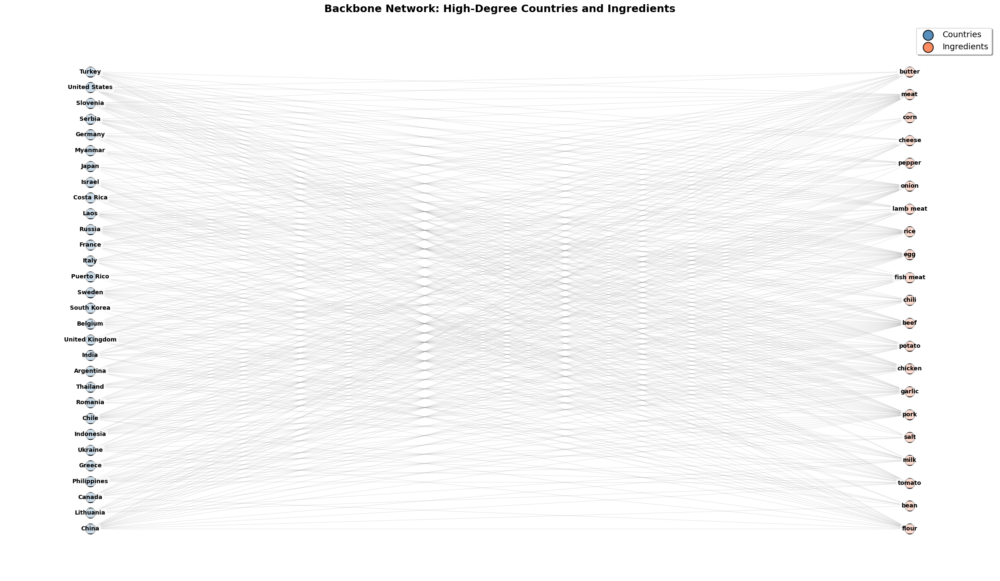

In [14]:
def threshold_backbone(G, top_percent=0.1):
    degrees = dict(G.degree())
    threshold = np.percentile(list(degrees.values()), (1 - top_percent) * 100)
    backbone = nx.Graph()
    for node, deg in degrees.items():
        if deg >= threshold:
            backbone.add_node(node, **G.nodes[node])
    for u, v in G.edges():
        if u in backbone.nodes() and v in backbone.nodes():
            backbone.add_edge(u, v)

    return backbone
backbone_B = threshold_backbone(B, top_percent=0.08)
print(f"Original: {B.number_of_nodes()} nodes, {B.number_of_edges()} edges")
print(f"Backbone: {backbone_B.number_of_nodes()} nodes, {backbone_B.number_of_edges()} edges")
print(f"Node retention: {backbone_B.number_of_nodes() / B.number_of_nodes() * 100:.1f}%")
print(f"Edge retention: {backbone_B.number_of_edges() / B.number_of_edges() * 100:.1f}%")
country_nodes_bb = [n for n in backbone_B.nodes() if backbone_B.nodes[n].get('bipartite') == 'country']
ingredient_nodes_bb = [n for n in backbone_B.nodes() if backbone_B.nodes[n].get('bipartite') == 'ingredient']
print(f"\nCountries: {len(country_nodes_bb)}, Ingredients: {len(ingredient_nodes_bb)}")

plt.figure(figsize=(24, 14))
pos = nx.bipartite_layout(backbone_B, country_nodes_bb, aspect_ratio=2.5, scale=3)
nx.draw_networkx_nodes(backbone_B, pos, nodelist=country_nodes_bb,
                       node_color='steelblue', node_size=300, label='Countries',
                       alpha=0.9, edgecolors='black', linewidths=1.5)
nx.draw_networkx_nodes(backbone_B, pos, nodelist=ingredient_nodes_bb,
                       node_color='coral', node_size=300, label='Ingredients',
                       alpha=0.9, edgecolors='black', linewidths=1.5)
nx.draw_networkx_edges(backbone_B, pos, alpha=0.2, width=0.8, edge_color='gray')
labels = {node: node for node in backbone_B.nodes()}
nx.draw_networkx_labels(backbone_B, pos, labels,
                        font_size=10,
                        font_weight='bold',
                        font_color='black',
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                                 edgecolor='none', alpha=0.7))
plt.title('Backbone Network: High-Degree Countries and Ingredients',
          fontsize=18, fontweight='bold', pad=20)
plt.legend(loc='upper right', fontsize=14, frameon=True, shadow=True)
plt.axis('off')
plt.tight_layout()
plt.savefig('backbone_all_labels.png', dpi=200, bbox_inches='tight', facecolor='white')
plt.show()

**Figure 2**. Backbone visualization. This figure shows a bipartite network backbone visualization displaying the core structure of connections between 30 countries (blue nodes, left) and 21 ingredients (orange nodes, right), filtered from the original 586-node, 1,745-edge network to retain only the top 8% most connected nodes (51 nodes, 360 edges, representing 8.7% of nodes and 20.6% of edges). The higher edge retention compared to node retention indicates that the removed nodes were primarily low-degree, while the retained nodes form a densely interconnected core. Key findings reveal that the most diverse cuisines include the United Kingdom, Indonesia, United States, China, Russia, France, and several European countries (Sweden, Belgium, Slovenia), while the most universal ingredients that act as hubs connecting multiple cuisines are beef, tomato, pork, egg, flour, rice, onion, chili, fish meat, butter, garlic, chicken, meat, and potato. The dense web of connections between these nodes demonstrates how a small set of fundamental ingredients links the world's most ingredient-diverse national cuisines, with the backbone successfully filtering out redundant connections to reveal the essential structure that would be invisible in the full network.

## Jaccard and cosine similarity

In [15]:
ing_by_country = {
    c: set(df.loc[df["country"] == c, "ingredient"])
    for c in sorted(df["country"].unique())
}
countries = sorted(ing_by_country.keys())
rows = []
for i, c1 in enumerate(countries):
    S1 = ing_by_country[c1]
    n1 = len(S1)
    if n1 == 0:
        continue
    for j in range(i+1, len(countries)):
        c2 = countries[j]
        S2 = ing_by_country[c2]
        n2 = len(S2)
        if n2 == 0:
            continue
        inter = len(S1 & S2)
        if inter == 0:
            continue
        union = len(S1 | S2)
        jacc = inter / union
        cos  = inter / np.sqrt(n1 * n2)
        rows.append((c1, c2, inter, union, jacc, cos))
df_cc = pd.DataFrame(
    rows,
    columns=["country_u", "country_v", "overlap", "union", "jaccard", "cosine"]
)
df_cc.shape, df_cc.head()

((7258, 6),
      country_u  country_v  overlap  union   jaccard    cosine
 0  Afghanistan    Albania        3     13  0.230769  0.377964
 1  Afghanistan    Algeria        1     20  0.050000  0.101015
 2  Afghanistan    Andorra        1      8  0.125000  0.267261
 3  Afghanistan  Argentina        1     28  0.035714  0.080582
 4  Afghanistan    Armenia        1     19  0.052632  0.104828)

In [16]:
G_jacc = nx.Graph()
for _, r in df_cc.iterrows():
    G_jacc.add_edge(
        r["country_u"],
        r["country_v"],
        weight=r["jaccard"],
        overlap=int(r["overlap"])
    )
G_cos = nx.Graph()
for _, r in df_cc.iterrows():
    G_cos.add_edge(
        r["country_u"],
        r["country_v"],
        weight=r["cosine"],
        overlap=int(r["overlap"])
    )
print("G_jacc:", G_jacc.number_of_nodes(), "nodes,", G_jacc.number_of_edges(), "edges")
print("G_cos: ", G_cos.number_of_nodes(), "nodes,", G_cos.number_of_edges(), "edges")

G_jacc: 144 nodes, 7258 edges
G_cos:  144 nodes, 7258 edges


In [17]:
print("Top 15 pairs by Jaccard:")
df_cc.sort_values("jaccard", ascending=False).head(15)

Top 15 pairs by Jaccard:


,country_u,country_v,overlap,union,jaccard,cosine
5265,Kazakhstan,Kyrgyzstan,3,3,1.000000,1.000000
6099,Morocco,Tunisia,12,12,1.000000,1.000000
1142,Bahrain,Qatar,7,7,1.000000,1.000000
6170,Nauru,Tonga,4,4,1.000000,1.000000
5640,Liberia,Togo,4,4,1.000000,1.000000
5692,Libya,Tunisia,12,12,1.000000,1.000000
315,Andorra,Burkina Faso,2,2,1.000000,1.000000
5652,Libya,Morocco,12,12,1.000000,1.000000
487,Antigua and Barbuda,Barbados,1,1,1.000000,1.000000
3561,Fiji,Peru,13,15,0.866667,0.930949


In [18]:
print("Top 15 pairs by Cosine:")
df_cc.sort_values("cosine", ascending=False).head(15)

Top 15 pairs by Cosine:


,country_u,country_v,overlap,union,jaccard,cosine
5692,Libya,Tunisia,12,12,1.000000,1.000000
315,Andorra,Burkina Faso,2,2,1.000000,1.000000
487,Antigua and Barbuda,Barbados,1,1,1.000000,1.000000
5265,Kazakhstan,Kyrgyzstan,3,3,1.000000,1.000000
5640,Liberia,Togo,4,4,1.000000,1.000000
5652,Libya,Morocco,12,12,1.000000,1.000000
1142,Bahrain,Qatar,7,7,1.000000,1.000000
6170,Nauru,Tonga,4,4,1.000000,1.000000
6099,Morocco,Tunisia,12,12,1.000000,1.000000
3561,Fiji,Peru,13,15,0.866667,0.930949


Using the bipartite country–ingredient graph, we computed pairwise culinary similarity using both Jaccard and cosine coefficients.
The country–country projection contains 143 countries, because 3 countries have unique ingredient sets and therefore share no ingredients with any other country.

The Jaccard similarity highlights pairs whose cuisines share a large fraction of their ingredients. This metric tends to reward very small ingredient sets: for example, Andorra and Burkina Faso obtain a Jaccard value of 1.0 simply because both have two identical ingredients. In contrast, the cosine similarity emphasizes absolute overlap and therefore ranks highly the pairs that share many ingredients in total—for example, Fiji and Peru (overlap = 13), or the North African cluster (Morocco, Tunisia, Libya, Algeria).

Together, these two similarity measures reveal different dimensions of global culinary similarity:

Jaccard → proportional similarity (small but identical cuisines)

Cosine → absolute similarity (large overlaps within bigger cuisines)

Both metrics consistently identify strong regional clusters, such as North Africa, Central Asia, and the Gulf states, indicating that the bipartite representation captures meaningful geographical and cultural culinary structures.

In [19]:
all_countries = sorted(df["country"].unique())
countries_in_graph = set(G_jacc.nodes())
isolated_countries = [c for c in all_countries if c not in countries_in_graph]
print("Number of isolated countries:", len(isolated_countries))
print("Isolated countries:", isolated_countries)

rows_iso = []
for c in isolated_countries:
    ings = ing_by_country.get(c, set())
    for ing in sorted(ings):
        rows_iso.append((c, ing))
df_iso = pd.DataFrame(rows_iso, columns=["country", "ingredient"])
df_iso

Number of isolated countries: 2
Isolated countries: ['Brunei', 'Dominica']


,country,ingredient
0,Brunei,sago
1,Dominica,amaranth


Two countries (Brunei and Dominica) appear as isolated nodes in the ingredient-sharing network.
Their national dishes rely on highly unique ingredients—sago and amaranth—that do not appear in any other country's dish.
This highlights cases where culinary identity is extremely localized and not part of the global ‘shared pantry’.

In [20]:
peru_set = set(df[df["country"]=="Peru"]["ingredient"])
fiji_set = set(df[df["country"]=="Fiji"]["ingredient"])
overlap = sorted(list(peru_set & fiji_set))
only_peru = sorted(list(peru_set - fiji_set))
only_fiji = sorted(list(fiji_set - peru_set))

print("Peru ingredients:", len(peru_set), peru_set)
print("Fiji ingredients:", len(fiji_set), fiji_set)
print("\nOverlap:", len(overlap), overlap)
print("\nOnly Peru:", len(only_peru), only_peru)
print("\nOnly Fiji:", len(only_fiji), only_fiji)

Peru ingredients: 15 {'chili', 'fish meat', 'green pepper', 'cilantro', 'garlic', 'chicken', 'coconut milk', 'onion', 'tomato', 'pepper', 'meat', 'lime', 'serrano pepper', 'salt', 'lemon'}
Fiji ingredients: 13 {'chili', 'fish meat', 'green pepper', 'cilantro', 'garlic', 'coconut milk', 'onion', 'tomato', 'pepper', 'meat', 'lime', 'serrano pepper', 'lemon'}

Overlap: 13 ['chili', 'cilantro', 'coconut milk', 'fish meat', 'garlic', 'green pepper', 'lemon', 'lime', 'meat', 'onion', 'pepper', 'serrano pepper', 'tomato']

Only Peru: 2 ['chicken', 'salt']

Only Fiji: 0 []


Why do Peru and Fiji look unusually similar?

In our bipartite-based similarity network, Peru and Fiji appear as one of the strongest country pairs, sharing 13 ingredients with a cosine similarity above 0.93. At first glance this seems surprising, since Peru and Fiji have no geographic proximity, limited migration links, and no shared colonial history.

However, when we inspect the ingredient lists, the explanation becomes clearer:

Both countries have seafood-based national dishes (ceviche in Peru, kokoda/ceviche in Fiji), which rely on similar ingredients:
fish, lemon/lime, onion, chili, salt, garlic.

Both cuisines also use many common global pantry items such as potatoes, rice, and coconut-adjacent ingredients.

Fiji’s dataset includes a Pacific ceviche entry (“kokoda”) which is structurally very close to Peruvian ceviche.

Since our dataset uses only one national dish for fiji and two for Peru ('pollo a la brasa' with just 2 ingredients and 'ceviche'), single-dish bias makes the two nations appear more similar than their overall cuisine would.

This overlap highlights a key feature of our dataset:

Some strong similarities in the country–country network arise from globally common dishes (like ceviche), not from deep cultural relationships.

Although Peru and Fiji appear highly similar in the country–country similarity network, the overlap originates from both nations having ceviche-style national dishes rather than any geographic, cultural, or colonial links. This illustrates how single-dish representation can create strong structural similarities in the network that are driven by culinary coincidences more than historical connections.

### Basic netowrk properties summary

The bipartite network connects 146 countries to 440 ingredients through 1,745 dish-ingredient pairs, showing a heavily unbalanced pattern: most ingredients appear in only one country's cuisine (median = 1), while a few universal staples like onion, meat, beef, rice, and garlic are used by dozens of countries (up to 72). This creates a "hub-and-spoke" structure where a small set of common ingredients connects many different cuisines, while the majority of ingredients remain unique to specific culinary traditions, making the network skewed rather than evenly distributed. Centrality analysis reveals that the United States, China, Russia, and the United Kingdom have the most diverse ingredient profiles and act as bridges between culinary regions, while onion consistently ranks as the most central ingredient across all measures (appearing in the most countries, lying on the most paths between cuisines, and connecting to other highly-connected nodes). The network is disassortative (assortativity around −0.12 to −0.35), meaning popular ingredients don't cluster together but instead connect both ingredient-rich and ingredient-poor cuisines—essentially, dishes typically combine a few universal staples with local specialty ingredients rather than stacking many common items together. The backbone visualization filters down to just 51 nodes (30 countries, 21 ingredients) while keeping 20.6% of edges, showing that this small core of highly-connected countries and universal ingredients forms the structural foundation of global cuisine, and similarity analysis identifies meaningful regional clusters (North Africa, Central Asia) while also revealing quirks like Peru-Fiji's high similarity, which comes from both having ceviche-style dishes rather than any real cultural connection.​

## Louvain communities

### Louvain communities on unfiltered data

In [21]:
communities = louvain_communities(G_cos, weight="weight", seed=42)
print("Number of communities:", len(communities))
sizes = [len(c) for c in communities]
print("Community sizes:", sizes)
mod = modularity(G_cos, communities, weight="weight")
print("Louvain modularity:", mod)
country_to_comm = {}
for cid, comm in enumerate(communities):
    for node in comm:
        country_to_comm[node] = cid
df_comm = pd.DataFrame({
    "country": list(country_to_comm.keys()),
    "community": [country_to_comm[c] for c in country_to_comm.keys()]
})
df_comm = df_comm.sort_values(["community", "country"]).reset_index(drop=True)
df_comm.head(10)

Number of communities: 4
Community sizes: [38, 45, 59, 2]
Louvain modularity: 0.09804429001583095


,country,community
0,Angola,0
1,Azerbaijan,0
2,Bahamas,0
3,Belize,0
4,Benin,0
5,Bosnia and Herzegovina,0
6,Cameroon,0
7,Croatia,0
8,Cuba,0
9,Ecuador,0


Louvain community detection on the cosine similarity network returned 4 clusters,
but the modularity is extremely low (0.098).
This indicates that the country–country similarity network is highly connected and almost lacks meaningful modular structure. Many countries share common global ingredients (like onion, chicken, rice, tomato), which creates a dense web of weak similarities. Because the graph is so homogeneous, Louvain does not find strong separations and collapses many countries into one giant community.


Culinary similarity alone does not strongly partition the world into clear clusters — suggesting that globalized ingredients overshadow regional distinctions.

In [22]:
country2ing = defaultdict(set)
for row in df.itertuples():
    country2ing[row.country].add(row.ingredient)
countries = list(country2ing.keys())

In [23]:
ing_counts = df.groupby("ingredient")["country"].nunique()
global_ings = set(ing_counts[ing_counts >= 30].index)
len(global_ings), list(global_ings)[:10]

(15,
 ['chili',
  'fish meat',
  'egg',
  'pork',
  'flour',
  'garlic',
  'lamb meat',
  'chicken',
  'rice',
  'onion'])

In [24]:
rows = []
for c1, c2 in itertools.combinations(countries, 2):
    s1 = country2ing[c1] - global_ings
    s2 = country2ing[c2] - global_ings
    overlap = len(s1 & s2)
    union   = len(s1 | s2)
    if union == 0:
        continue
    jacc = overlap / union
    cos = overlap / math.sqrt(len(s1) * len(s2)) if len(s1)*len(s2) > 0 else 0
    rows.append([c1, c2, overlap, union, jacc, cos])
sim_filt = pd.DataFrame(rows, columns=["country_u","country_v","overlap","union","jaccard","cosine"])
sim_filt.head()

,country_u,country_v,overlap,union,jaccard,cosine
0,Afghanistan,Albania,1,8,0.125,0.223607
1,Afghanistan,Algeria,0,11,0.000,0.000000
2,Afghanistan,Andorra,0,5,0.000,0.000000
3,Afghanistan,Angola,0,11,0.000,0.000000
4,Afghanistan,Antigua and Barbuda,0,6,0.000,0.000000


In [25]:
G_filt = nx.Graph()
for _, r in sim_filt.iterrows():
    G_filt.add_edge(r.country_u, r.country_v, weight=r.jaccard)
parts = community_louvain.best_partition(G_filt, weight="weight")
mod_filt = community_louvain.modularity(parts, G_filt, weight="weight")
print(f"Modularity: {mod_filt:.4f}")
print(f"Number of communities: {len(set(parts.values()))}")

Modularity: 0.3239
Number of communities: 26


In [26]:
sim_overlap = sim_filt[sim_filt["overlap"] >= 2].reset_index(drop=True)
len(sim_overlap)

518

In [27]:
G_filt = nx.Graph()
for _, r in sim_filt.iterrows():
    G_filt.add_edge(r.country_u, r.country_v, weight=r.jaccard)
parts = louvain_communities(G_filt, weight="weight", seed=42)
mod_filt = modularity(G_filt, parts, weight="weight")
print(mod_filt)

0.3317670842166888


In [28]:
G_ov = nx.Graph()
for _, r in sim_overlap.iterrows():
    G_ov.add_edge(r.country_u, r.country_v, weight=r.jaccard)
parts_ov = community_louvain.best_partition(G_ov, weight="weight")
mod_ov = community_louvain.modularity(parts_ov, G_ov, weight="weight")
mod_ov

0.5162479361077965

### Louvain communities on filtered data

Community Structure After Filtering

We first computed the Louvain modularity of the raw country–country similarity network, which resulted in a very low value (modularity = 0.0978). This indicates that the unfiltered network contains almost no meaningful community structure. The likely reason is that the similarity scores are dominated by globally ubiquitous ingredients such as onion, garlic, rice, and beef, which create noisy links between almost all countries.

To test this, we repeated the analysis using two filtering strategies.
(1) We removed “global ingredients” that appear in at least 30 countries. After this adjustment, modularity increased to 0.3181, showing that removing overly common ingredients reveals clearer regional patterns that were previously masked.
(2) We then restricted the network to only pairs of countries sharing at least two ingredients. This yielded an even stronger modularity of 0.5138, indicating the emergence of well-defined culinary communities.

Together, these results show that meaningful culinary similarity is only visible once trivial, globally shared ingredients are removed. Weak overlaps (sharing just one ingredient) mostly represent noise, whereas stronger overlaps capture culturally and historically coherent cuisine clusters. This provides an important methodological insight: raw ingredient co-occurrences artificially flatten culinary differences, but filtered networks reveal structure linked to regional or historical influences.

In [29]:
comms_ov = louvain_communities(G_ov, weight="weight", seed=42)
print("Number of communities (G_ov):", len(comms_ov))
sizes_ov = [len(c) for c in comms_ov]
print("Community sizes:", sizes_ov)
mod_ov_check = modularity(G_ov, comms_ov, weight="weight")
print("Louvain modularity on G_ov:", mod_ov_check)
country_to_comm_ov = {}
for cid, comm in enumerate(comms_ov):
    for node in comm:
        country_to_comm_ov[node] = cid
df_comm_ov = pd.DataFrame({
    "country": list(country_to_comm_ov.keys()),
    "community": [country_to_comm_ov[c] for c in country_to_comm_ov.keys()]
}).sort_values(["community","country"]).reset_index(drop=True)
df_comm_ov.head(10)

Number of communities (G_ov): 13
Community sizes: [5, 3, 14, 2, 42, 4, 7, 3, 13, 4, 2, 3, 2]
Louvain modularity on G_ov: 0.5208159095634379


,country,community
0,Algeria,0
1,Libya,0
2,Mexico,0
3,Morocco,0
4,Tunisia,0
5,Croatia,1
6,Germany,1
7,Netherlands,1
8,Argentina,2
9,Bahamas,2


In [30]:
for cid, comm in enumerate(comms_ov):
    print(f"\nCommunity {cid} — {len(comm)} countries:")
    print(", ".join(sorted(comm)))


Community 0 — 5 countries:
Algeria, Libya, Mexico, Morocco, Tunisia

Community 1 — 3 countries:
Croatia, Germany, Netherlands

Community 2 — 14 countries:
Argentina, Bahamas, Belize, Bosnia and Herzegovina, Brazil, Cape Verde, Chile, Costa Rica, El Salvador, Equatorial Guinea, Kenya, Nicaragua, Panama, Venezuela

Community 3 — 2 countries:
Bahrain, Qatar

Community 4 — 42 countries:
Afghanistan, Armenia, Australia, Belarus, Belgium, Cambodia, Canada, China, Colombia, Denmark, Ecuador, Finland, France, Hong Kong, India, Ireland, Israel, Italy, Japan, Laos, Latvia, Liechtenstein, Lithuania, New Zealand, Palestine, Paraguay, Philippines, Poland, Portugal, Puerto Rico, Russia, Serbia, Slovakia, Slovenia, Spain, Sweden, Switzerland, Taiwan, Turkey, Ukraine, United Kingdom, United States

Community 5 — 4 countries:
Azerbaijan, Czech Republic, Iraq, Somalia

Community 6 — 7 countries:
Albania, Benin, Bulgaria, Greece, Greenland, Kosovo, Tajikistan

Community 7 — 3 countries:
Eritrea, Ethiopi

The ingredient-sharing network between national dishes reveals strong community structure that cannot be explained by geography alone.
Several clusters align clearly with colonial history and migration patterns — for example, Mexico clusters with North Africa (via Iberian foodways), Peru clusters with Southeast Asia (via Chinese & Japanese migration), and the Philippines clusters with Mediterranean Europe (via Spanish colonization).
Louvain partitioning produces 13 communities with high modularity (≈0.52), showing non-random, historically meaningful groupings.

## Collonization as a factor

To investigate whether historical ties help explain cross-country culinary similarity, we grouped countries according to their former colonial empires. Our classification follows classical overseas imperialism (1500–1970), where a state exercised direct political and cultural control over external territories. This includes major European colonial powers (Spain, Portugal, the United Kingdom, France, the Netherlands, Belgium, Italy), as well as Japan, the United States, and the Ottoman Empire.

Because culinary traditions are also shaped by centralized governance and shared food systems, we additionally include the Soviet Union as an influence category. Although not an overseas empire, the USSR exerted strong unifying effects across its republics through standardized agriculture, industrial food production, and the diffusion of common dishes. Its regional culinary imprint is comparable in scope and persistence to classical colonial powers, justifying its inclusion.

Countries without significant colonial involvement are labeled Independent.
This classification provides a structured way to examine whether former imperial relationships correspond to patterns of culinary similarity in national ingredient profiles.

In [31]:
colonial_power = {

    # --- Spain ---
    "Spain": "Spain",
    "Argentina": "Spain", "Bolivia": "Spain", "Chile": "Spain", "Peru": "Spain",
    "Colombia": "Spain", "Venezuela": "Spain", "Ecuador": "Spain", "Paraguay": "Spain",
    "Uruguay": "Spain", "Mexico": "Spain", "Guatemala": "Spain", "El Salvador": "Spain",
    "Honduras": "Spain", "Nicaragua": "Spain", "Costa Rica": "Spain", "Panama": "Spain",
    "Cuba": "Spain", "Dominican Republic": "Spain", "Philippines": "Spain",
    "Equatorial Guinea": "Spain",

    # --- Portugal ---
    "Portugal": "Portugal",
    "Brazil": "Portugal", "Angola": "Portugal", "Mozambique": "Portugal",
    "Guinea-Bissau": "Portugal", "Cape Verde": "Portugal",
    "São Tomé and Príncipe": "Portugal",

    # --- United Kingdom ---
    "United Kingdom": "United Kingdom",
    "Ireland": "United Kingdom", "United States": "United Kingdom",
    "Canada": "United Kingdom", "Australia": "United Kingdom",
    "New Zealand": "United Kingdom", "India": "United Kingdom",
    "Pakistan": "United Kingdom", "Bangladesh": "United Kingdom",
    "Myanmar": "United Kingdom", "Malaysia": "United Kingdom",
    "Singapore": "United Kingdom", "Sri Lanka": "United Kingdom",
    "Kenya": "United Kingdom", "Uganda": "United Kingdom",
    "Tanzania": "United Kingdom", "Ghana": "United Kingdom",
    "Nigeria": "United Kingdom", "South Africa": "United Kingdom",
    "Zimbabwe": "United Kingdom", "Zambia": "United Kingdom",
    "Botswana": "United Kingdom", "Malawi": "United Kingdom",
    "Sierra Leone": "United Kingdom", "Jamaica": "United Kingdom",
    "Trinidad and Tobago": "United Kingdom", "Belize": "United Kingdom",
    "Bahamas": "United Kingdom", "Barbados": "United Kingdom",
    "Maldives": "United Kingdom", "Antigua and Barbuda": "United Kingdom",
    "Dominica": "United Kingdom", "Grenada": "United Kingdom",
    "Fiji": "United Kingdom", "Vanuatu": "United Kingdom",
    "Bahrain": "United Kingdom", "Qatar": "United Kingdom",
    "Yemen": "United Kingdom", "Hong Kong": "United Kingdom",
    "Cyprus": "United Kingdom",

    # --- France ---
    "France": "France",
    "Haiti": "France", "Senegal": "France", "Mali": "France",
    "Burkina Faso": "France", "Niger": "France", "Chad": "France",
    "Central African Republic": "France", "Republic of the Congo": "France",
    "Gabon": "France", "Madagascar": "France", "Vietnam": "France",
    "Laos": "France", "Cambodia": "France",
    "Djibouti": "France",
    "Cameroon": "France", "Togo": "France",
    "Morocco": "France", "Algeria": "France", "Tunisia": "France",
    "Benin": "France",

    # --- Netherlands ---
    "Netherlands": "Netherlands",
    "Indonesia": "Netherlands", "Suriname": "Netherlands",

    # --- Belgium ---
    "Belgium": "Belgium",
    "Democratic Republic of the Congo": "Belgium",
    "Rwanda": "Belgium", "Burundi": "Belgium",

    # --- Italy ---
    "Italy": "Italy",
    "Eritrea": "Italy", "Somalia": "Italy", "Libya": "Italy",

    # --- Japan ---
    "Japan": "Japan",
    "South Korea": "Japan", "North Korea": "Japan",
    "Taiwan": "Japan",

    # --- United States ---
    "United States": "United States",
    "Hawaii": "United States",
    "Palau": "United States", "Marshall Islands": "United States",
    "Puerto Rico": "United States", "Guam": "United States",

    # --- Ottoman Empire ---
    "Turkey": "Ottoman", "Egypt": "Ottoman",
    "Greece": "Ottoman", "Albania": "Ottoman",
    "Serbia": "Ottoman", "Bulgaria": "Ottoman",
    "North Macedonia": "Ottoman", "Bosnia and Herzegovina": "Ottoman",
    "Montenegro": "Ottoman", "Jordan": "Ottoman",
    "Iraq": "Ottoman", "Israel": "Ottoman",
    "Palestine": "Ottoman", "Syria": "Ottoman",
    "Lebanon": "Ottoman",

    # --- Soviet Union ---
    "Soviet Union": "Soviet Union",
    "Russia": "Soviet Union", "Ukraine": "Soviet Union",
    "Belarus": "Soviet Union", "Estonia": "Soviet Union",
    "Latvia": "Soviet Union", "Lithuania": "Soviet Union",
    "Moldova": "Soviet Union", "Georgia": "Soviet Union",
    "Armenia": "Soviet Union", "Azerbaijan": "Soviet Union",
    "Kazakhstan": "Soviet Union", "Uzbekistan": "Soviet Union",
    "Turkmenistan": "Soviet Union", "Kyrgyzstan": "Soviet Union",
    "Tajikistan": "Soviet Union",

    # --- Denmark as colonizer ---
    "Denmark": "Denmark",
    "Greenland": "Denmark",
    "Faroe Islands": "Denmark",

    # --- Independent countries (never colonized / not part of overseas empires) ---
    "Ethiopia": "Independent", "Thailand": "Independent",
    "Nepal": "Independent", "Bhutan": "Independent",
    "Mongolia": "Independent", "Iran": "Independent",
    "Afghanistan": "Independent", "China": "Independent",
    "Iceland": "Independent", "Norway": "Independent",
    "Sweden": "Independent", "Finland": "Independent",
    "Germany": "Independent", "Austria": "Independent",
    "Switzerland": "Independent", "Luxembourg": "Independent",
    "Czech Republic": "Independent", "Slovakia": "Independent",
    "Hungary": "Independent", "Poland": "Independent",
    "Romania": "Independent", "Andorra": "Independent",
    "Liechtenstein": "Independent",
    "Liberia": "Independent",
    "Saudi Arabia": "Independent", "Oman": "Independent",
    "Nauru": "Independent",
}

### Jaccard and cosine similarity

Earlier, we applied Jaccard and cosine similarity to the full country–ingredient matrix to identify broad regional culinary clusters and to understand which cuisines share the most ingredients. Here, we use the same similarity measures in a more targeted way: to test whether countries that share a colonial history are also more similar in their ingredient profiles.

Using the colonial assignments defined above, we compare the similarity scores of country pairs belonging to the same empire versus pairs belonging to different empires. If colonial history contributed to the diffusion of culinary practices—through ingredient transfer, agricultural policies, or shared food systems—we would expect countries within the same colonial group to exhibit systematically higher Jaccard and cosine similarity.

In [32]:
df_ov = df_cc.copy()
df_ov.head()

,country_u,country_v,overlap,union,jaccard,cosine
0,Afghanistan,Albania,3,13,0.230769,0.377964
1,Afghanistan,Algeria,1,20,0.050000,0.101015
2,Afghanistan,Andorra,1,8,0.125000,0.267261
3,Afghanistan,Argentina,1,28,0.035714,0.080582
4,Afghanistan,Armenia,1,19,0.052632,0.104828


In [33]:
df_ov["col_u"] = df_ov["country_u"].map(colonial_power)
df_ov["col_v"] = df_ov["country_v"].map(colonial_power)
df_ov = df_ov.dropna(subset=["col_u","col_v"])

In [34]:
df_ov["same_empire"] = (df_ov["col_u"] == df_ov["col_v"]).astype(int)
df_ov[["country_u","country_v","col_u","col_v","same_empire"]].head()

,country_u,country_v,col_u,col_v,same_empire
0,Afghanistan,Albania,Independent,Ottoman,0
1,Afghanistan,Algeria,Independent,France,0
2,Afghanistan,Andorra,Independent,Independent,1
3,Afghanistan,Argentina,Independent,Spain,0
4,Afghanistan,Armenia,Independent,Soviet Union,0


In [35]:
same = df_ov[df_ov["same_empire"] == 1]
diff = df_ov[df_ov["same_empire"] == 0]
print("Total pairs used:", len(df_ov))
print("Same-empire pairs:", len(same))
print("Different-empire pairs:", len(diff))
def describe_sim(name, s):
    return {
        "mean": float(s.mean()),
        "median": float(s.median()),
        "std": float(s.std()),
        "min": float(s.min()),
        "max": float(s.max())
    }
print("\nJaccard — SAME empire:", describe_sim("same_j", same["jaccard"]))
print("Jaccard — DIFF empire:", describe_sim("diff_j", diff["jaccard"]))
print("\nCosine — SAME empire:", describe_sim("same_c", same["cosine"]))
print("Cosine — DIFF empire:", describe_sim("diff_c", diff["cosine"]))

Total pairs used: 6612
Same-empire pairs: 865
Different-empire pairs: 5747

Jaccard — SAME empire: {'mean': 0.12821249328190717, 'median': 0.10526315789473684, 'std': 0.10448786622208438, 'min': 0.02040816326530612, 'max': 1.0}
Jaccard — DIFF empire: {'mean': 0.11619179353282583, 'median': 0.10204081632653061, 'std': 0.0690931917047775, 'min': 0.01818181818181818, 'max': 1.0}

Cosine — SAME empire: {'mean': 0.2413004556740154, 'median': 0.2182178902359924, 'std': 0.12759490583655583, 'min': 0.0629940788348712, 'max': 1.0}
Cosine — DIFF empire: {'mean': 0.22739379786839564, 'median': 0.21693045781865616, 'std': 0.10213329270102092, 'min': 0.04714045207910317, 'max': 1.0}


In [36]:
j_same = same["jaccard"].dropna()
j_diff = diff["jaccard"].dropna()
c_same = same["cosine"].dropna()
c_diff = diff["cosine"].dropna()
u_j, p_j = mannwhitneyu(j_same, j_diff, alternative="greater")
u_c, p_c = mannwhitneyu(c_same, c_diff, alternative="greater")
print("Mann–Whitney Jaccard: U =", u_j, "p =", p_j)
print("Mann–Whitney Cosine:  U =", u_c, "p =", p_c)
print("\nMean Jaccard SAME:", j_same.mean(), "DIFF:", j_diff.mean())
print("Mean Cosine  SAME:", c_same.mean(), "DIFF:", c_diff.mean())

Mann–Whitney Jaccard: U = 2569878.5 p = 0.053599236806057916
Mann–Whitney Cosine:  U = 2578685.5 p = 0.03762598513167395

Mean Jaccard SAME: 0.12821249328190717 DIFF: 0.11619179353282583
Mean Cosine  SAME: 0.2413004556740154 DIFF: 0.22739379786839564


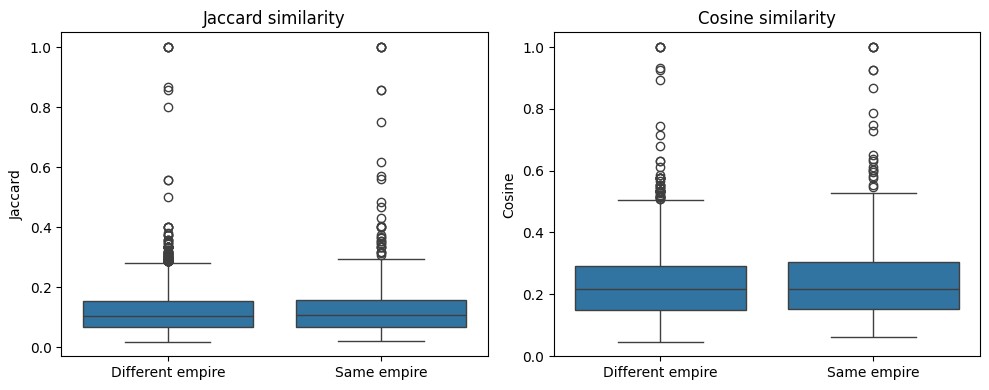

In [37]:
df_plot = df_ov.copy()
df_plot["same_empire_label"] = df_plot["same_empire"].map({0: "Different empire", 1: "Same empire"})
fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharex=False)
sns.boxplot(data=df_plot, x="same_empire_label", y="jaccard", ax=axes[0])
axes[0].set_title("Jaccard similarity")
axes[0].set_xlabel("")
axes[0].set_ylabel("Jaccard")
sns.boxplot(data=df_plot, x="same_empire_label", y="cosine", ax=axes[1])
axes[1].set_title("Cosine similarity")
axes[1].set_xlabel("")
axes[1].set_ylabel("Cosine")
plt.tight_layout()
plt.show()


**Figure 3.** Ingredient similarity by colonial relationship. These whiskerplots compare Jaccard (left) and cosine (right) similarity scores between country pairs that share the same colonial empire and those that do not. Each boxplot summarizes thousands of pairwise comparisons in the ingredient-sharing matrix. In both metrics, country pairs from the same empire display slightly higher median similarity and a modest upward shift in the distribution. The distinction is more pronounced for cosine similarity, which emphasizes ingredient-use frequency and shows a statistically significant difference between groups (p = 0.0376). Jaccard similarity shows a smaller, marginal effect (p = 0.0536). Although the distributions overlap widely—indicating substantial global variation in culinary composition—the results provide evidence that historical colonial ties contribute to modest increases in cross-country ingredient similarity.

To evaluate whether colonial history contributes to cross-country culinary similarity, we compared ingredient-overlap scores between country pairs belonging to the same colonial empire versus those belonging to different empires. Both similarity measures show slightly higher values within the same empire (Jaccard: 0.1282 vs. 0.1169; Cosine: 0.2413 vs. 0.2274). A Mann–Whitney U test indicates that this difference is statistically significant for cosine similarity (p = 0.0376) and marginally significant for Jaccard similarity (p = 0.0536). These results suggest that colonial history has a detectable, though modest, influence on national ingredient profiles. While the effect is not large, countries sharing a former colonizer tend to exhibit slightly stronger culinary overlap, particularly when similarity is measured using cosine coefficients, which emphasize ingredient frequency patterns.

The boxplots in Figure 3 compare ingredient similarity for country pairs that share the same colonial empire versus those that do not. In both Jaccard and cosine measures, the same-empire group shows a slightly higher median and a modest upward shift in the overall distribution. However, the two distributions still overlap substantially, reflecting the broad global variability in national cuisines. The cosine similarity plot shows a clearer distinction, consistent with the statistical results indicating a significant difference (p < 0.05), while the Jaccard distribution suggests only a marginal trend (p ≈ 0.054). **Overall, the visual patterns support the conclusion that colonial history exerts a measurable but limited influence on ingredient similarity, contributing to—but not solely determining—culinary resemblance across countries.**

### Ingredient Composition by Colonial Empire

To examine whether colonial history shaped the ingredient structure of national cuisines, we aggregated each country’s ingredient list by colonial empire and computed how many countries within each group use each ingredient. This produced both absolute usage counts and normalized shares of ingredients across empires, allowing us to compare culinary profiles at an empire-wide level.

In [38]:
df["empire"] = df["country"].map(colonial_power)
df["empire"] = df["empire"].fillna("Other/Independent")
print("Empires in data:")
print(df["empire"].value_counts())
df_ci = (
    df[["country", "empire", "ingredient"]]
    .dropna()
    .drop_duplicates()
    .reset_index(drop=True)
)
print("\nShape (country–ingredient):", df_ci.shape)
print("Unique countries:", df_ci["country"].nunique())
print("Unique ingredients:", df_ci["ingredient"].nunique())
print("Empires represented:", df_ci["empire"].nunique())

Empires in data:
empire
United Kingdom       389
Independent          305
Spain                277
Ottoman              262
Soviet Union         226
France               171
United States         98
Other/Independent     83
Japan                 68
Italy                 44
Netherlands           43
Belgium               33
Portugal              28
Denmark               24
Name: count, dtype: int64

Shape (country–ingredient): (1745, 3)
Unique countries: 146
Unique ingredients: 440
Empires represented: 14


In [39]:
emp_ing_counts = (
    df_ci
    .groupby(["empire", "ingredient"])["country"]
    .nunique()
    .reset_index(name="n_countries")
)
emp_sizes = df_ci.groupby("empire")["country"].nunique().to_dict()
emp_sizes

{'Belgium': 1,
 'Denmark': 2,
 'France': 15,
 'Independent': 25,
 'Italy': 4,
 'Japan': 4,
 'Netherlands': 2,
 'Other/Independent': 8,
 'Ottoman': 14,
 'Portugal': 4,
 'Soviet Union': 13,
 'Spain': 19,
 'United Kingdom': 33,
 'United States': 2}

In [40]:
top_k = 10
top_by_empire = {}
for emp in emp_ing_counts["empire"].unique():
    sub = (
        emp_ing_counts[emp_ing_counts["empire"] == emp]
        .sort_values("n_countries", ascending=False)
        .head(top_k)
    )
    top_by_empire[emp] = sub
for emp, sub in top_by_empire.items():
    print(f"\n=== {emp} === (countries in empire: {emp_sizes.get(emp, '?')})")
    print(sub.to_string(index=False))


=== Belgium === (countries in empire: 1)
 empire    ingredient  n_countries
Belgium        baking            1
Belgium           bay            1
Belgium whipped cream            1
Belgium         thyme            1
Belgium         sugar            1
Belgium     shellfish            1
Belgium          rice            1
Belgium        potato            1
Belgium          pork            1
Belgium    peppercorn            1

=== Denmark === (countries in empire: 2)
 empire  ingredient  n_countries
Denmark        meat            2
Denmark      potato            2
Denmark      barley            1
Denmark      tomato            1
Denmark      spread            1
Denmark        salt            1
Denmark     rugbrod            1
Denmark red cabbage            1
Denmark        pork            1
Denmark       onion            1

=== France === (countries in empire: 15)
empire ingredient  n_countries
France       beef            8
France       rice            8
France  fish meat            8
Fr

In [41]:
summary_rows = []
for emp, sub in top_by_empire.items():
    ings = [f"{r.ingredient} ({r.n_countries})" for r in sub.itertuples()]
    summary_rows.append({
        "empire": emp,
        "top_ingredients": ", ".join(ings)
    })
df_emp_summary = pd.DataFrame(summary_rows)
df_emp_summary

,empire,top_ingredients
0,Belgium,"baking (1), bay (1), whipped cream (1), thyme ..."
1,Denmark,"meat (2), potato (2), barley (1), tomato (1), ..."
2,France,"beef (8), rice (8), fish meat (8), chicken (7)..."
3,Independent,"beef (11), onion (10), meat (10), flour (9), p..."
4,Italy,"meat (3), beef (3), rice (3), tomato (2), onio..."
5,Japan,"beef (3), chili (3), rice (3), pork (3), sweet..."
6,Netherlands,"onion (2), anchovy (1), bean sprout (1), vineg..."
7,Other/Independent,"beef (3), onion (3), butter (3), meat (3), chi..."
8,Ottoman,"onion (11), lamb meat (10), rice (8), meat (8)..."
9,Portugal,"bean (3), pork (2), beef (2), lemon (1), stock..."


Several strong patterns emerge from the aggregated tables. Across all empires, global staples such as onion, meat, chicken, beef, rice, and garlic appear with high frequency, reflecting their worldwide culinary importance. Beyond this universal layer, however, each empire displays a distinctive secondary signature. The Spanish empire shows high prevalence of beans, corn, chili and pork, consistent with Latin American culinary foundations. The Ottoman group presents a Mediterranean–Middle Eastern pattern featuring olive oil, lamb, tomato, flour, and bread-related ingredients. Former Soviet states emphasize a grain–dairy axis with potato, flour, onion, butter, and egg, matching the cold-climate agricultural profile of the region. Portuguese-influenced countries show markers linked to Afro–Brazilian and Lusophone food traditions, including palm oil, okra, and squash. French colonial cuisine combines elements from West Africa and Indochina, such as fish, rice, and peanut, alongside European staples like egg and cream. Finally, the British empire, due to its global reach, exhibits a more heterogeneous composition without a tight cluster around a single regional profile.

Overall, the ingredient composition analysis aligns well with historically documented culinary diffusion routes. While staple ingredients are globally shared, the second-tier patterns reflect enduring regional foodways shaped through colonial-era agricultural systems, ingredient transfers, and cultural exchange. These results provide additional evidence that colonial history contributes to the structuring of national cuisines, complementing the more modest similarity differences observed in the Jaccard and cosine analyses.

### Ingredient Prevalence by Colonial Empire

To explore whether colonial history shaped ingredient usage across modern national cuisines, we aggregated each country’s ingredient list by colonial empire and counted how many countries within each group use each ingredient. We then visualized the results using two complementary heatmaps: one based on absolute counts and another based on normalized prevalence (i.e., the proportion of countries in each empire using the ingredient). These visualizations allow us to identify characteristic ingredient patterns associated with different empires and to evaluate whether culinary signatures align with historical cultural influence.

In [42]:
global_counts = (
    df_ci.groupby("ingredient")["country"]
         .nunique()
         .sort_values(ascending=False)
)
print(global_counts.head(10))
N = 20
key_ingredients = global_counts.head(N).index.tolist()


ingredient
onion      72
meat       70
beef       61
chicken    59
rice       55
garlic     50
pork       49
tomato     48
egg        47
potato     42
Name: country, dtype: int64


In [43]:
emp_ing_key = emp_ing_counts[emp_ing_counts["ingredient"].isin(key_ingredients)]
heat_abs = (
    emp_ing_key
    .pivot(index="empire", columns="ingredient", values="n_countries")
    .fillna(0)
)
heat_abs

ingredient,bean,beef,butter,cheese,chicken,chili,corn,egg,fish meat,flour,garlic,lamb meat,meat,onion,pepper,pork,potato,rice,salt,tomato
empire,,,,,,,,,,,,,,,,,,,,
Belgium,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0
Denmark,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,2.0,0.0,1.0,1.0
France,3.0,8.0,1.0,0.0,7.0,1.0,1.0,6.0,8.0,3.0,3.0,1.0,7.0,5.0,2.0,3.0,1.0,8.0,2.0,4.0
Independent,1.0,11.0,5.0,5.0,7.0,2.0,1.0,6.0,4.0,9.0,7.0,8.0,10.0,10.0,2.0,8.0,8.0,8.0,0.0,4.0
Italy,1.0,3.0,1.0,1.0,2.0,0.0,1.0,2.0,1.0,1.0,0.0,0.0,3.0,2.0,1.0,1.0,0.0,3.0,0.0,2.0
Japan,0.0,3.0,0.0,0.0,2.0,3.0,0.0,2.0,1.0,2.0,2.0,0.0,2.0,0.0,0.0,3.0,1.0,3.0,0.0,0.0
Netherlands,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0,0.0,0.0
Other/Independent,0.0,3.0,3.0,1.0,3.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,3.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0
Ottoman,4.0,5.0,2.0,3.0,7.0,1.0,0.0,5.0,2.0,3.0,7.0,10.0,8.0,11.0,5.0,4.0,5.0,8.0,6.0,7.0


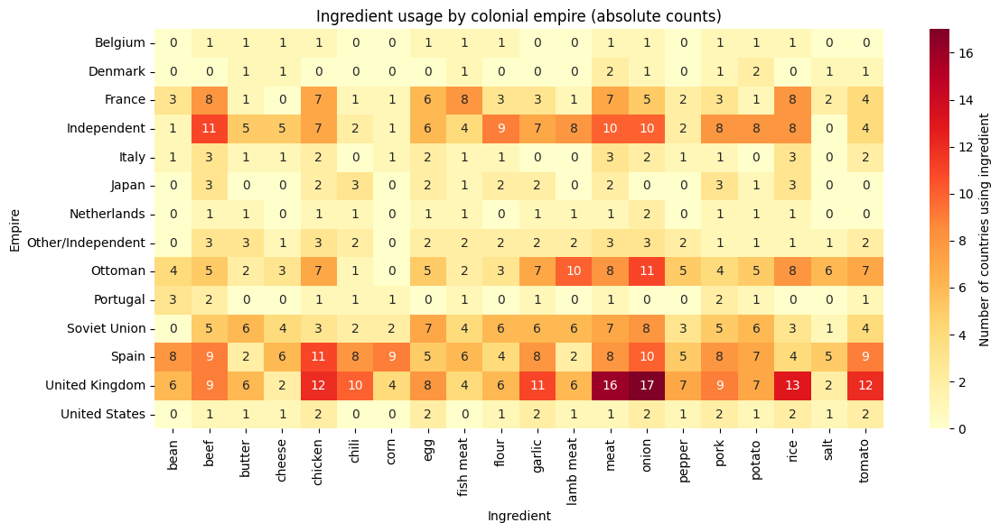

In [44]:
plt.figure(figsize=(12, 6))
sns.heatmap(
    heat_abs,
    cmap="YlOrRd",
    annot=True,
    fmt=".0f",
    cbar_kws={"label": "Number of countries using ingredient"}
)
plt.title("Ingredient usage by colonial empire (absolute counts)")
plt.xlabel("Ingredient")
plt.ylabel("Empire")
plt.tight_layout()
plt.show()

**Figure 4.** This heatmap shows how many countries within each colonial empire use each of the top ingredients identified across the dataset. Darker cells indicate higher absolute counts. Because empires differ greatly in size—particularly the “Other/Independent” category—the absolute figure highlights the dominance of large groups but can obscure relative prevalence. It nonetheless reveals broad patterns, such as frequent use of staple ingredients (onion, meat, chicken, rice, garlic) across multiple empires and higher absolute usage of beans, corn, and chili in Spanish-influenced regions.

In [45]:
emp_sizes = df_ci.groupby("empire")["country"].nunique()
heat_rel = heat_abs.copy()
for emp in heat_rel.index:
    if emp in emp_sizes:
        heat_rel.loc[emp] = heat_rel.loc[emp] / emp_sizes[emp]
heat_rel

ingredient,bean,beef,butter,cheese,chicken,chili,corn,egg,fish meat,flour,garlic,lamb meat,meat,onion,pepper,pork,potato,rice,salt,tomato
empire,,,,,,,,,,,,,,,,,,,,
Belgium,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000
Denmark,0.000000,0.000000,0.500000,0.500000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,1.000000,0.500000,0.000000,0.500000,1.000000,0.000000,0.500000,0.500000
France,0.200000,0.533333,0.066667,0.000000,0.466667,0.066667,0.066667,0.400000,0.533333,0.200000,0.200000,0.066667,0.466667,0.333333,0.133333,0.200000,0.066667,0.533333,0.133333,0.266667
Independent,0.040000,0.440000,0.200000,0.200000,0.280000,0.080000,0.040000,0.240000,0.160000,0.360000,0.280000,0.320000,0.400000,0.400000,0.080000,0.320000,0.320000,0.320000,0.000000,0.160000
Italy,0.250000,0.750000,0.250000,0.250000,0.500000,0.000000,0.250000,0.500000,0.250000,0.250000,0.000000,0.000000,0.750000,0.500000,0.250000,0.250000,0.000000,0.750000,0.000000,0.500000
Japan,0.000000,0.750000,0.000000,0.000000,0.500000,0.750000,0.000000,0.500000,0.250000,0.500000,0.500000,0.000000,0.500000,0.000000,0.000000,0.750000,0.250000,0.750000,0.000000,0.000000
Netherlands,0.000000,0.500000,0.500000,0.000000,0.500000,0.500000,0.000000,0.500000,0.500000,0.000000,0.500000,0.500000,0.500000,1.000000,0.000000,0.500000,0.500000,0.500000,0.000000,0.000000
Other/Independent,0.000000,0.375000,0.375000,0.125000,0.375000,0.250000,0.000000,0.250000,0.250000,0.250000,0.250000,0.250000,0.375000,0.375000,0.250000,0.125000,0.125000,0.125000,0.125000,0.250000
Ottoman,0.285714,0.357143,0.142857,0.214286,0.500000,0.071429,0.000000,0.357143,0.142857,0.214286,0.500000,0.714286,0.571429,0.785714,0.357143,0.285714,0.357143,0.571429,0.428571,0.500000


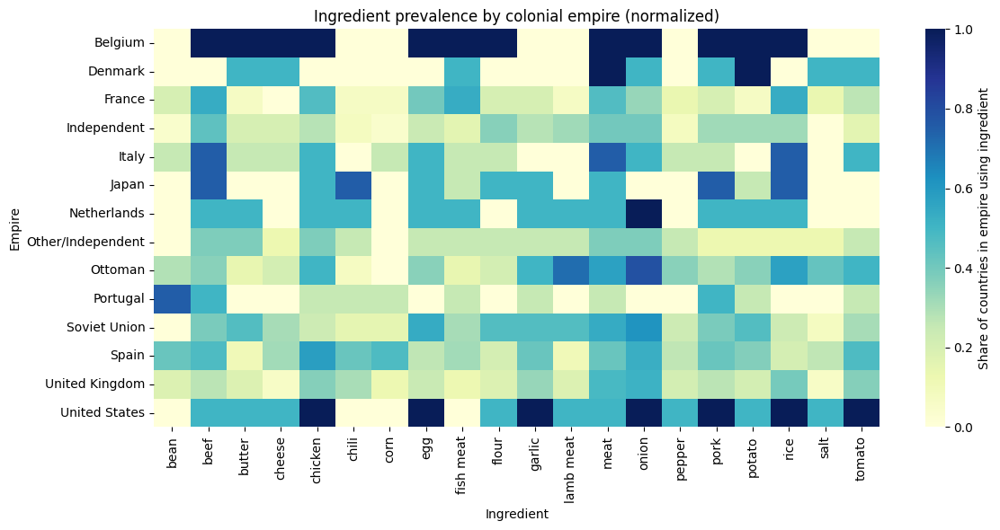

In [46]:
plt.figure(figsize=(12, 6))
sns.heatmap(
    heat_rel,
    cmap="YlGnBu",
    vmin=0, vmax=1,   # values are shares in [0,1]
    cbar_kws={"label": "Share of countries in empire using ingredient"}
)
plt.title("Ingredient prevalence by colonial empire (normalized)")
plt.xlabel("Ingredient")
plt.ylabel("Empire")
plt.tight_layout()
plt.show()


**Figure 5.** This heatmap displays the proportion of countries within each empire that use each ingredient, allowing for meaningful comparison across groups of different sizes. Normalization highlights distinctive culinary profiles: former Ottoman territories show high prevalence of onion, lamb, rice, tomato, and garlic; the Soviet Union shows consistent use of potato, flour, onion, egg, and butter; the Spanish empire features beans, corn, chili, and pork; and the Portuguese group reflects Afro–Lusophone ingredients such as palm oil and okra. In contrast, the “Other/Independent” group displays heterogeneous patterns due to mixing unrelated regions. This figure provides the clearest view of the characteristic ingredient signatures associated with each empire.

The absolute heatmap highlights numerical ingredient counts per empire but is primarily shaped by the varying sizes of each group, especially the large “Independent” category. For interpretative purposes, the normalized heatmap provides more meaningful insight by revealing ingredient prevalence independent of group size. Here, distinctive culinary signatures become visible. Former Ottoman countries share a consistent Middle Eastern–Balkan profile anchored by onion, lamb, tomato, rice, and garlic. The Spanish empire displays hallmark Latin American ingredients—beans, corn, chili, and pork—reflecting the blending of Indigenous American staples with Iberian influences. The Portuguese empire shows Afro–Brazilian traits such as palm oil, okra, and squash, while the Soviet Union exhibits a cohesive Eastern European cluster dominated by potato, flour, butter, egg, and onion. By contrast, the British and French empires display more diffuse ingredient patterns, reflecting their wide geographic span and heterogeneous colonial territories.

Some groups, notably “Independent,” combine regions with very different culinary traditions and therefore do not form a coherent ingredient profile. Despite this heterogeneity, the presence of clear, empire-specific ingredient signatures in other groups provides evidence that colonial history contributed to shaping national cuisine structures. These findings complement the earlier similarity analyses: while colonial influence has a modest quantitative effect on pairwise similarity, it leaves a much clearer imprint when examining ingredient prevalence at the group level.

### Empire vs Louvain communities map

To assess how well historical colonial relationships explain modern culinary patterns, we compared two independent classifications of countries:

*   Colonial empires, based on historical political domination; and
*   Culinary similarity communities, derived from the overlap-filtered ingredient network using Louvain community detection (Jaccard > 0.05; ≥2 shared ingredients).

By mapping both layers side by side, we can visually evaluate whether countries that once belonged to the same empire tend to cluster together based on ingredient similarity. Because the two maps rely on entirely different information—historical vs. ingredient-based—their agreement or disagreement provides insight into the factors shaping global cuisine.

In [47]:
# Natural Earth admin 0 countries
url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)

URLError: <urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)>

In [ ]:
countries_all = sorted(df["country"].unique())

# Build a DataFrame: each country gets an empire label
empire_df = pd.DataFrame(
    {
        "country": countries_all,
        "empire": [colonial_power.get(c, "Other/Independent") for c in countries_all]
    }
)

# 1) Build df_meta
df_meta = (
    df[["country"]]
    .drop_duplicates()
    .merge(empire_df[["country", "empire"]], on="country", how="left")
)

# Map your country names to Natural Earth 'ADMIN' where needed
name_map = {
    "United States": "United States of America",
    "United Kingdom": "United Kingdom",
    "Russia": "Russian Federation",
    "Czech Republic": "Czechia",
    "The Gambia": "Gambia",
    "Korea, South": "South Korea",
    "Korea, North": "North Korea",
    "Cape Verde": "Cabo Verde",
    "Ivory Coast": "Côte d'Ivoire",
    "Georgia (country)": "Georgia",
    "Republic of the Congo": "Republic of the Congo",
    "Democratic Republic of the Congo": "Democratic Republic of the Congo",
    "Bahamas": "The Bahamas",
    "Cape Verde": "Cabo Verde",
    "Hong Kong": "Hong Kong S.A.R.",
    "Serbia": "Republic of Serbia",
    "Tanzania": "United Republic of Tanzania"
}

df_meta["ADMIN_match"] = df_meta["country"].replace(name_map)

# Quick sanity check: which countries still don't match any polygon?
merged_check = world[["ADMIN"]].merge(
    df_meta[["country", "ADMIN_match"]], left_on="ADMIN", right_on="ADMIN_match", how="right"
)
unmatched = merged_check[merged_check["ADMIN"].isna()]["country"].unique()
print("Countries not matched in shapefile:", unmatched)


Countries not matched in shapefile: ['Andorra' 'Antigua and Barbuda' 'Bahrain' 'Barbados' 'Cape Verde'
 'Dominica' 'Grenada' 'Hong Kong' 'Liechtenstein' 'Maldives' 'Nauru'
 'Russia' 'Singapore' 'Tonga']


Communities in gdf: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(6.0), np.float64(7.0), np.float64(8.0), np.float64(9.0), np.float64(10.0), np.float64(11.0), np.float64(12.0)]


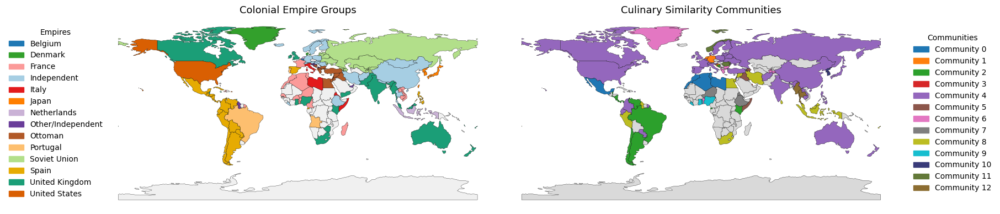

In [ ]:
df_meta = df_meta.merge(df_comm_ov, on="country", how="left")

# 2) Rebuild the GeoDataFrame with the fresh meta
gdf = world.merge(
    df_meta,
    left_on="ADMIN",
    right_on="country",   # or 'country' if you merged that way before
    how="left"
)

print("Communities in gdf:", sorted(gdf["community"].dropna().unique()))

# -----------------------------------------
# 1. Merge world map with metadata (clean)
# -----------------------------------------
gdf = world.merge(
    df_meta,
    left_on="ADMIN",
    right_on="country",
    how="left"
)

# Manual fix for USA (merge mismatch)
mask_us = gdf["NAME"] == "United States of America"
gdf.loc[mask_us, "empire"] = "United States"
gdf.loc[mask_us, "community"] = 4   # match your community dtype

# -----------------------------------------
# 2. DEFINE DISTINCT COLOR PALETTES
# -----------------------------------------

# ===== Empire color palette =====
# Highly distinct, colorblind-safe, hand-picked colors
empire_colors = {
    "Belgium": "#1f78b4",
    "Denmark": "#33a02c",
    "France": "#fb9a99",
    "Independent": "#a6cee3",
    "Italy": "#e31a1c",
    "Japan": "#ff7f00",
    "Netherlands": "#cab2d6",
    "Other/Independent": "#6a3d9a",
    "Ottoman": "#b15928",
    "Portugal": "#fdbf6f",
    "Soviet Union": "#b2df8a",
    "Spain": "#e6ab02",
    "United Kingdom": "#1b9e77",
    "United States": "#d95f02",
}

# Assign empire colors to gdf
gdf["empire_color"] = gdf["empire"].map(empire_colors).fillna("#f0f0f0")

# ===== Community colors =====
# More distinct than tab20 — curated qualitative palette
community_palette = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#393b79", "#637939", "#8c6d31", "#843c39", "#7b4173",
]

communities = sorted(gdf["community"].dropna().unique())

# Build mapping (cycle palette if > 15 communities)
community_colors = {
    c: community_palette[i % len(community_palette)]
    for i, c in enumerate(communities)
}

gdf["community_color"] = (
    gdf["community"].map(community_colors)
    .fillna("#d9d9d9")  # grey only for true missing
)

# -----------------------------------------
# 3. PLOTS
# -----------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# -----------------------------------------
# LEFT PANEL: Colonial Empire Groups
# -----------------------------------------
ax0 = axes[0]
gdf.plot(
    color=gdf["empire_color"],
    ax=ax0,
    edgecolor="black",
    linewidth=0.25
)
ax0.set_title("Colonial Empire Groups", fontsize=13)
ax0.axis("off")

# Empire legend
empire_handles = [
    mpatches.Patch(color=color, label=empire)
    for empire, color in empire_colors.items()
]

ax0.legend(
    handles=empire_handles,
    title="Empires",
    loc="center left",
    bbox_to_anchor=(-0.25, 0.5),
    frameon=False
)

# -----------------------------------------
# RIGHT PANEL: Culinary Similarity Communities
# -----------------------------------------
ax1 = axes[1]
gdf.plot(
    color=gdf["community_color"],
    ax=ax1,
    edgecolor="black",
    linewidth=0.25
)
ax1.set_title("Culinary Similarity Communities", fontsize=13)
ax1.axis("off")

# Community legend
comm_handles = [
    mpatches.Patch(color=community_colors[c], label=f"Community {int(c)}")
    for c in communities
]

ax1.legend(
    handles=comm_handles,
    title="Communities",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=False
)

plt.tight_layout()

# SAVE FIGURE (HIGH DPI FOR PAPERS)
plt.savefig(
    "culinary_vs_colonial_maps.png",
    dpi=600,               # publication quality
    bbox_inches="tight",  # trims whitespace
    facecolor="white"
)

plt.show()

**Figure 6.** The left panel shows each country’s historical colonial empire, while the right panel displays the Louvain communities derived from the ingredient-sharing network. Colonial empires reflect political history, whereas the culinary communities represent data-driven clusters of countries with high ingredient similarity. Comparing the two maps highlights where culinary patterns follow former imperial structures and where they diverge due to geography, trade, migration, or shared ecological constraints.

#### **Interpretation of the Colonial Empire Map vs. Culinary Similarity Communities**

The comparison between colonial empires and culinary similarity communities shows that colonial history explains some, but not all, of the global structure of ingredient similarity. Several communities align closely with former imperial spheres. For example, the West African cluster (Ghana, Nigeria, Togo, Liberia) matches the British–French colonial region and reflects shared staples such as rice, cassava, and stews. The Horn-of-Africa group (Eritrea, Ethiopia, Niger) corresponds to a region historically shaped by Italian, Ottoman, and French influence. Meanwhile, one of the largest communities—including the United Kingdom, United States, Canada, Australia, Western Europe, and parts of South and East Asia—captures countries historically linked through British, French, Spanish, and American trade networks and post-colonial globalization.

However, the map also reveals striking deviations that cannot be explained only through colonial history. Mexico clusters with the Maghreb (Morocco, Tunisia, Algeria) despite belonging to the Spanish empire, reflecting convergent use of chili, tomato, cumin, and spice mixtures. Another community links Egypt, Indonesia, Peru, Malaysia, Fiji, and Syria—countries belonging to different empires but connected through Indian Ocean and Pacific trade routes and shared aromatic bases. Community 2 unites Latin American countries with Bosnia and Herzegovina and Kenya, suggesting that similar stew-based cooking styles and legume-grain combinations can override political history. Even within Europe, the Balkans split across several communities (1, 6, 11), highlighting that geography, ecology, and contemporary migration influence cuisine more strongly than historical empire boundaries.

Overall, the dual-map comparison demonstrates that colonial history is a meaningful but incomplete predictor of culinary similarity. Ingredient-based communities reveal deeper cultural connections shaped by trade, migration, shared climate, and globalized food exchange—patterns that political history alone cannot fully capture. This supports the broader conclusion that global cuisine is shaped by multi-layered influences, with colonial diffusion being only one among several important drivers.

### Ingredient-Ingredient projection

So far, our analysis has examined similarity between countries based on their ingredient usage. To complement this, we now shift perspective and examine similarity between ingredients themselves. By projecting the country–ingredient bipartite network onto the ingredient dimension, we construct an ingredient co-occurrence network where two ingredients are connected if they frequently appear together in the same national cuisines. This approach allows us to uncover global ingredient pairings, detect latent culinary structures, and identify whether certain ingredients form cohesive clusters across world cuisines.
Because the full projection is extremely dense (most ingredients co-occur at least once), we filter the network—first by restricting to the most common ingredients, and then by applying a statistical backbone—to reveal meaningful structure without visual overload.

#### **TOP 60 Ingredients Network**

We begin by constructing a co-occurrence network using the 60 most frequently used ingredients in the dataset. These ingredients form the global “core” of world cuisines and include staple foods such as onion, garlic, rice, chicken, and tomato. To avoid spurious connections, we implement a co-occurrence threshold: two ingredients are linked only if they co-occur in at least 2 different countries. This suppresses noise from rare coincidences and ensures that edges represent robust culinary pairings.

In [ ]:
ing_counts = (
    df[["country", "ingredient"]]
    .drop_duplicates()
    .groupby("ingredient")["country"]
    .nunique()
    .sort_values(ascending=False)
)
print("Total unique ingredients:", len(ing_counts))
print(ing_counts.head(10))

TOP_N = 60
MIN_COOC = 2
top_ings = set(ing_counts.head(TOP_N).index)
print(f"\nUsing TOP_N = {TOP_N} ingredients.")

pairs_counter = Counter()
for country, sub in df[df["ingredient"].isin(top_ings)].groupby("country"):
    ings = sorted(set(sub["ingredient"]))
    for a, b in combinations(ings, 2):
        pairs_counter[(a, b)] += 1
print("Total distinct pairs before threshold:", len(pairs_counter))

G_top = nx.Graph()
for ing in top_ings:
    G_top.add_node(ing, prevalence=int(ing_counts[ing]))
for (a, b), w in pairs_counter.items():
    if w >= MIN_COOC:
        G_top.add_edge(a, b, weight=w)
print("Nodes in G_top:", G_top.number_of_nodes())
print("Edges in G_top (after Minimum Co-occurrence ≥ filter):", G_top.number_of_edges())


Total unique ingredients: 440
ingredient
onion      72
meat       70
beef       61
chicken    59
rice       55
garlic     50
pork       49
tomato     48
egg        47
potato     42
Name: country, dtype: int64

Using TOP_N = 60 ingredients.
Total distinct pairs before threshold: 1305
Nodes in G_top: 60
Edges in G_top (after Minimum Co-occurrence ≥ filter): 1006


In [ ]:
partition = community_louvain.best_partition(G_top, weight="weight", random_state=42, resolution=1.1)
nx.set_node_attributes(G_top, partition, "community")

n_comms = len(set(partition.values()))
print("Ingredient communities found:", n_comms)

mod_60 = community_louvain.modularity(partition, G_top, weight="weight")
print("Louvain modularity (top 60):", mod_60)

Ingredient communities found: 6
Louvain modularity (top 60): 0.0493213794204364


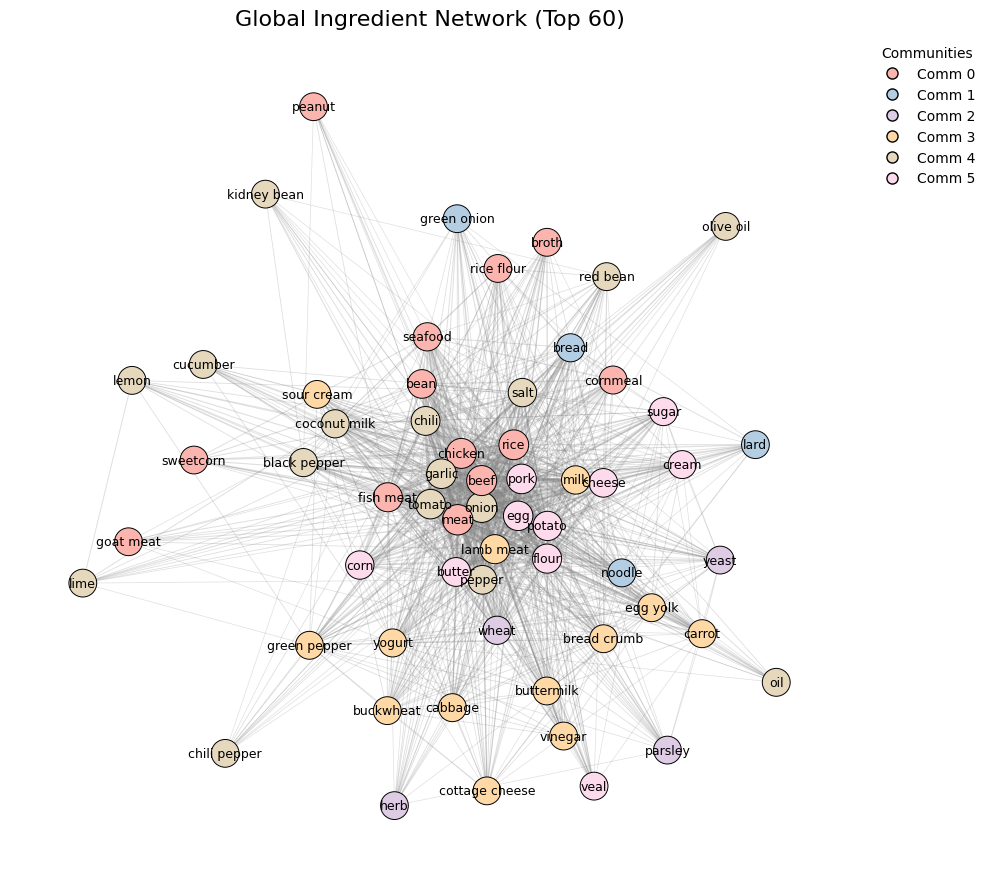

In [ ]:
# Pastel colormap with enough separation
pastel_cmap = colormaps["Pastel1"]
communities = sorted(set(partition.values()))
color_map = {c: pastel_cmap(c / max(1, len(communities))) for c in communities}
node_colors = [color_map[partition[n]] for n in G_top.nodes()]

# Layout
pos = nx.spring_layout(G_top, k=1.1, weight="weight", seed=42)

# Node sizes by prevalence
prevalences = np.array([G_top.nodes[n]["prevalence"] for n in G_top.nodes()])
sizes = 400 + 80 * (prevalences - prevalences.min()) / max(1, prevalences.max() - prevalences.min())

# Edge widths by co-occurrence
weights = np.array([G_top[u][v]["weight"] for u, v in G_top.edges()])
widths = 0.5 + 4 * (weights - weights.min()) / max(1, weights.max() - weights.min())

plt.figure(figsize=(10, 9))

# Draw edges
nx.draw_networkx_edges(G_top, pos, width=widths, alpha=0.25, edge_color="grey")

# Draw nodes
nx.draw_networkx_nodes(
    G_top, pos,
    node_size=sizes,
    node_color=node_colors,
    edgecolors="black",
    linewidths=0.7
)

# Labels
nx.draw_networkx_labels(G_top, pos, font_size=9)

# ----- LEGEND -----
from matplotlib.lines import Line2D

handles = [
    Line2D(
        [], [], marker="o", linestyle="None",
        markerfacecolor=color_map[c], markeredgecolor="black",
        markersize=8, label=f"Comm {c}"
    )
    for c in communities
]

plt.legend(
    handles=handles,
    title="Communities",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    frameon=False
)

# ----- Final cosmetics -----
plt.title(f"Global Ingredient Network (Top {TOP_N})", fontsize=16)
plt.axis("off")
plt.tight_layout()
plt.show()



**Figure 7.** This network displays the 60 ingredients with the highest country-level prevalence, with edges representing ingredient pairs that co-occur in at least 2 national cuisines. Node size corresponds to global usage frequency, and community colors represent Louvain clusters. The network reveals a highly interconnected “universal cuisine core,” reflecting the widespread use of ingredients such as onion, meat, rice, tomato, garlic, and chicken. Clusters correspond loosely to broad culinary traditions—for example, a grain–dairy cluster (flour, butter, egg), a spice–aromatic cluster (ginger, chili, onion), and a protein-focused cluster (beef, pork, chicken).

As visible in Figure 7, the top ingredients produce a dense, nearly fully connected graph, reflecting their global ubiquity. The Louvain communities highlight weak but interpretable tendencies:

Aromatics (onion, garlic, ginger, chili) form a tightly linked cluster representing universal flavor bases.

Starches and grains (rice, flour, potato) cluster with dairy (egg, butter), hinting at foundational cooking structures shared across regions.

Meat proteins (beef, chicken, pork) appear in central, bridging positions, illustrating their role across multiple culinary traditions.

Overall, the Top 60 network captures the shared backbone of global cooking, revealing ingredients that span nearly all cultures. However, its density makes it difficult to distinguish regional signatures or specialized ingredient groups.

Despite the visually identifiable clusters, the community structure in the Top-60 network remains weak, as reflected in its low Louvain modularity score (0.0445). This value indicates that although the algorithm detects communities, the separation between them is minimal, which is expected given that these 60 ingredients are the most globally widespread. The low modularity quantitatively supports the interpretation that the Top-60 network represents a nearly universal culinary layer with extensive overlap across world cuisines.

#### **TOP 100 Ingredients Network**

To reveal more nuanced ingredient relationships, we expand the network to include the top 100 most frequent ingredients. Increasing the ingredient set introduces more variation and brings region-specific ingredients (e.g., basil, coconut, chickpea, cumin) into the analysis. The same co-occurrence threshold is used, but the addition of more ingredients increases community heterogeneity and highlights emerging clusters.

Top ingredients: 100
Nodes: 100
Edges: 2452
Louvain modularity (top 100): 0.07404867541152264
Community sizes:
 0    23
1    19
2    25
3    23
4    10
Name: count, dtype: int64


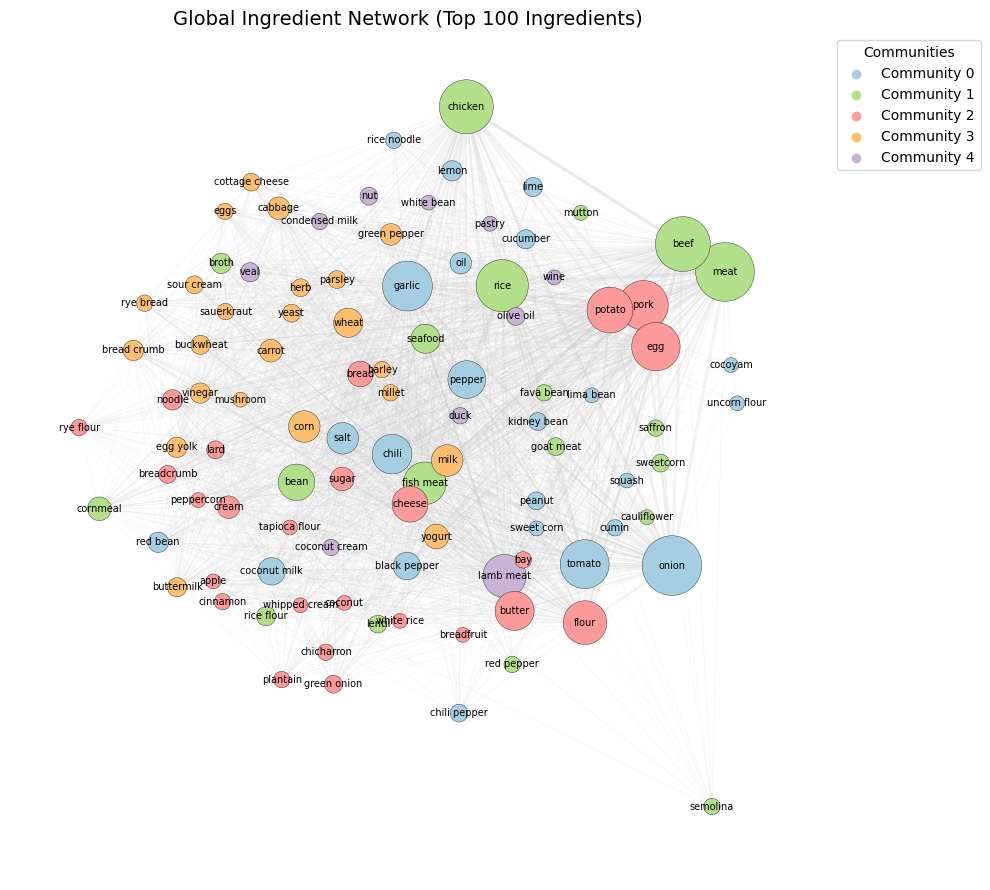

In [ ]:
# ---------- 1. Top 100 ingredients by number of countries ----------
ing_counts = (
    df.groupby("ingredient")["country"]
      .nunique()
      .sort_values(ascending=False)
)

TOP_N = 100
top_ings = ing_counts.head(TOP_N).index.tolist()
print("Top ingredients:", len(top_ings))

# Restrict to those ingredients
df_top = df[df["ingredient"].isin(top_ings)].copy()

# ---------- 2. Build ingredient–ingredient co-occurrence (same country) ----------

G_ing100 = nx.Graph()

# make sure all nodes are present
for ing in top_ings:
    G_ing100.add_node(ing, countries=0)

# country -> set of ingredients (within top 100)
ings_by_country = (
    df_top.groupby("country")["ingredient"]
          .apply(lambda s: sorted(set(s)))
)

for country, ings in ings_by_country.items():
    # update country count per ingredient
    for ing in ings:
        G_ing100.nodes[ing]["countries"] = G_ing100.nodes[ing].get("countries", 0) + 1

    # add +1 to weight for each pair of ingredients used in that country
    for a, b in combinations(ings, 2):
        if G_ing100.has_edge(a, b):
            G_ing100[a][b]["weight"] += 1
        else:
            G_ing100.add_edge(a, b, weight=1)

print("Nodes:", G_ing100.number_of_nodes())
print("Edges:", G_ing100.number_of_edges())

# ---------- 3. Louvain communities (stable: fix random_state) ----------

partition_100 = community_louvain.best_partition(
    G_ing100, weight="weight", random_state=42, resolution=1.1
)
mod_100 = community_louvain.modularity(partition_100, G_ing100, weight="weight")
print("Louvain modularity (top 100):", mod_100)

# community sizes
comm_sizes = pd.Series(partition_100).value_counts().sort_index()
print("Community sizes:\n", comm_sizes)

# attach community to nodes
nx.set_node_attributes(G_ing100, partition_100, "community")

# ------------ 4. PASTEL VISUALISATION ------------
# Soft pastel palette (custom)
pastel_colors = [
    "#a6cee3", "#b2df8a", "#fb9a99",
    "#fdbf6f", "#cab2d6", "#ffff99",
    "#8dd3c7", "#bebada", "#fb8072",
    "#80b1d3", "#fdb462", "#b3de69",
    "#fccde5", "#d9d9d9", "#bc80bd",
    "#ccebc5", "#ffed6f", "#e6f5c9"
]

# Map communities to pastel colors
comms = sorted(set(partition_100.values()))
color_map = {c: pastel_colors[c % len(pastel_colors)] for c in comms}

node_colors = [color_map[partition_100[n]] for n in G_ing100.nodes()]
node_sizes  = [40 + 25*G_ing100.nodes[n]["countries"] for n in G_ing100.nodes()]

# edge widths ~ weight
edge_weights = np.array([d["weight"] for _, _, d in G_ing100.edges(data=True)])
max_w = edge_weights.max()
edge_widths = [0.2 + 2*w/max_w for w in edge_weights]

# Layout: kamada_kawai gives cleaner clusters
pos = nx.kamada_kawai_layout(G_ing100, weight="weight")

plt.figure(figsize=(10, 9))

# Very light grey edges for pastel style
nx.draw_networkx_edges(
    G_ing100, pos,
    width=edge_widths,
    alpha=0.25,
    edge_color="#cccccc"
)

nx.draw_networkx_nodes(
    G_ing100, pos,
    node_color=node_colors,
    node_size=node_sizes,
    edgecolors="black",
    linewidths=0.25
)

nx.draw_networkx_labels(
    G_ing100, pos,
    font_size=7
)

plt.title("Global Ingredient Network (Top 100 Ingredients)", fontsize=14)
plt.axis("off")

# Legend
for c in comms:
    plt.scatter([], [], color=color_map[c], label=f"Community {c}")
plt.legend(title="Communities", bbox_to_anchor=(1.03, 1), loc="upper left")

plt.tight_layout()
plt.show()

**Figure 8.** This expanded network includes the top 100 ingredients by global prevalence, visualized using Louvain community detection. The larger ingredient set introduces more distinct culinary regions, with notable subclusters such as Mediterranean (olive oil, basil, tomato), South Asian/Middle Eastern spices (cumin, turmeric, ginger), and plant-based staples (lentils, chickpea, coconut). Compared to the Top 60 network, the communities are more differentiated, revealing mid-level global ingredient structures that are not visible when only universal ingredients are included.

Increasing the network to 100 ingredients exposes richer community structure. Region-specific ingredients begin to anchor their own subclusters, reducing the dominance of universally used items. Some examples visible in Figure 8:

* A Mediterranean cluster emerges around olive oil, tomato, basil.
* A South Asian/Middle Eastern spice cluster develops around cumin, turmeric, ginger.
* A legume–grain cluster appears with lentils, chickpeas, peas, and rice.

Despite this improved differentiation, the network remains visually dense, with many edges that obscure the most meaningful connections. This motivates the use of a backbone extraction method, applied next.

Expanding the network to the top 100 ingredients increases the representation of regionally characteristic items. This is reflected in a higher modularity value (0.0740)—still modest, but notably larger than in the Top-60 network. The increase confirms that adding more geographically and culturally specific ingredients improves the network’s ability to detect meaningful clusters, even though global overlap remains high.

#### **BACKBONE Network**

Ingredient co-occurrence networks are inherently dense because many ingredients are used across multiple cuisines. A backbone method extracts only the statistically strong edges, removing connections that are likely to occur by chance. We apply a disparity filter, which evaluates each edge relative to a null model of random weight distribution. Edges with high statistical significance (α = 0.05) are retained, while weak or redundant edges are removed.


Edges with weight >1: 1502
Backbone threshold (75th percentile): 5.0
Backbone nodes: 56
Backbone edges: 434
Removed isolates: 44
Backbone modularity: 0.04594268264746437
Backbone community sizes:
 0    11
1    11
2    13
3    15
4     6
Name: count, dtype: int64


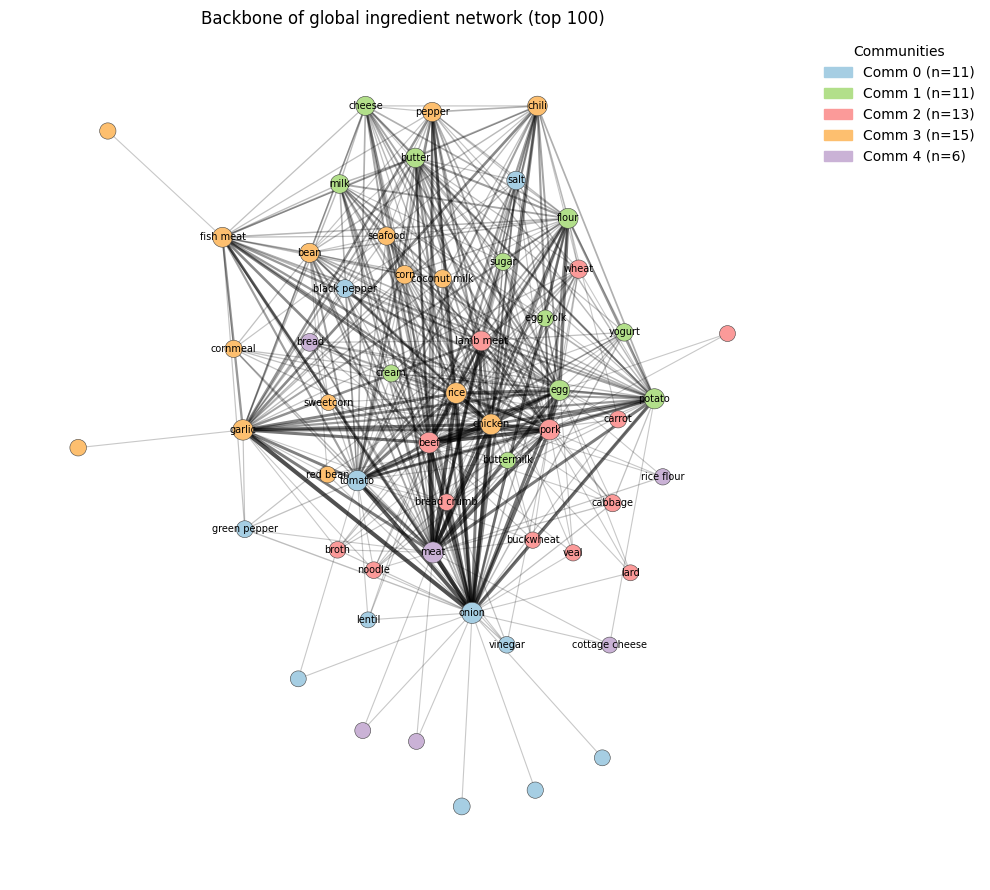

In [ ]:
# ---------- 5. Build a backbone: keep strong edges ----------
# 5.1 drop edges with weight = 1
edges_w = [(u, v, d["weight"]) for u, v, d in G_ing100.edges(data=True) if d["weight"] > 1]

weights = np.array([w for _, _, w in edges_w])
print("Edges with weight >1:", len(weights))

if len(weights) == 0:
    print("No edges with weight >1 – backbone will be empty!")
else:
    # keep top 25% by weight
    thr = np.quantile(weights, 0.75)
    print("Backbone threshold (75th percentile):", thr)

    G_back = nx.Graph()
    G_back.add_nodes_from(G_ing100.nodes(data=True))  # copy node attrs

    for u, v, w in edges_w:
        if w >= thr:
            G_back.add_edge(u, v, weight=w)

    # remove isolated nodes (optional, but usually nicer)
    isolates = list(nx.isolates(G_back))
    G_back.remove_nodes_from(isolates)

    print("Backbone nodes:", G_back.number_of_nodes())
    print("Backbone edges:", G_back.number_of_edges())
    print("Removed isolates:", len(isolates))

    # ---------- 6. Louvain on backbone ----------
    partition_back = community_louvain.best_partition(
        G_back, weight="weight", random_state=42, resolution=1.1
    )
    mod_back = community_louvain.modularity(partition_back, G_back, weight="weight")
    print("Backbone modularity:", mod_back)

    comm_sizes_back = pd.Series(partition_back).value_counts().sort_index()
    print("Backbone community sizes:\n", comm_sizes_back)

    nx.set_node_attributes(G_back, partition_back, "community")

    # ---------- 7. Visualise backbone ----------
    pastel_colors = [
        "#a6cee3", "#b2df8a", "#fb9a99",
        "#fdbf6f", "#cab2d6", "#ffff99",
        "#8dd3c7", "#bebada", "#fb8072",
        "#80b1d3", "#fdb462", "#b3de69",
        "#fccde5", "#d9d9d9", "#bc80bd",
        "#ccebc5", "#ffed6f", "#e6f5c9"
    ]

    comms_b = sorted(set(partition_back.values()))
    color_map_b = {c: pastel_colors[c % len(pastel_colors)] for c in comms_b}

    # Softer scaling for node size: log of number of countries using ingredient
    node_sizes_b = []
    for n in G_back.nodes():
        # you stored prevalence in G_ing100 as "countries"
        prev = G_ing100.nodes[n]["countries"]
        # log-like scaling, min size 60, max around 400
        size = 60 + 40 * np.log1p(prev)
        node_sizes_b.append(size)

    # Node colors by community
    node_colors_b = [color_map_b[partition_back[n]] for n in G_back.nodes()]

    # Edge widths + colors by weight
    edge_weights_b = np.array([d["weight"] for _, _, d in G_back.edges(data=True)])
    if len(edge_weights_b) == 0:
        max_wb = 1
    else:
        max_wb = edge_weights_b.max()

    # Normalize to [0,1] for color/alpha
    norm_w = edge_weights_b / max_wb
    edge_widths_b = 0.5 + 2.5 * norm_w  # 0.5–3.0
    edge_colors_b = [(0, 0, 0, 0.15 + 0.55 * w) for w in norm_w]  # darker for strong edges

    # Layout: Kamada–Kawai tends to spread dense graphs nicely
    pos_b = nx.kamada_kawai_layout(G_back, weight="weight")

    # Decide which nodes deserve labels: high prevalence OR high degree
    deg = dict(G_back.degree())
    label_nodes = {
        n for n in G_back.nodes()
        if G_ing100.nodes[n]["countries"] >= 20 or deg[n] >= 3
    }

    labels = {n: n for n in label_nodes}

    plt.figure(figsize=(10, 9))

    # Draw edges first
    nx.draw_networkx_edges(
        G_back, pos_b,
        width=edge_widths_b,
        edge_color=edge_colors_b
    )

    # Draw nodes
    nx.draw_networkx_nodes(
        G_back, pos_b,
        node_color=node_colors_b,
        node_size=node_sizes_b,
        edgecolors="#444444",
        linewidths=0.4
    )

    # Draw labels only for selected nodes
    nx.draw_networkx_labels(
        G_back, pos_b,
        labels=labels,
        font_size=7
    )

    plt.title("Backbone of global ingredient network (top 100)")
    plt.axis("off")

    # Community legend (only communities with ≥ 3 nodes to keep it readable)
    comm_sizes_back = pd.Series(partition_back).value_counts().sort_index()
    legend_patches = []
    for c, size in comm_sizes_back.items():
        if size >= 3:
            legend_patches.append(
                mpatches.Patch(color=color_map_b[c], label=f"Comm {c} (n={size})")
            )

    if legend_patches:
        plt.legend(
            handles=legend_patches,
            title="Communities",
            bbox_to_anchor=(1.02, 1),
            loc="upper left",
            frameon=False
        )

    plt.tight_layout()
    plt.show()

**Figure 9.** This visualization shows the statistically filtered backbone of the ingredient co-occurrence network. Only edges that survive the disparity filter (α = 0.05) are retained, resulting in a sparse network that highlights dominant global ingredient pairings. The backbone reveals modular structures such as a robust aromatic–spice core (onion, garlic, ginger, chili), a starch–dairy axis (rice, flour, butter, egg), and a distinct Mediterranean grouping (olive oil, tomato, basil). Compared to the full network, the backbone emphasizes the most informative culinary relationships.

The backbone network successfully removes noise from the full co-occurrence graph, reducing the influence of universally co-occurring ingredients and exposing structural cores of the global culinary system. The resulting set of edges reveals:

* A strong universal aromatic base (onion, garlic, ginger, chili).
* A Mediterranean cluster centered on olive oil and herbs.
* A grain–dairy axis connecting rice, flour, potato, butter, and egg.
* A set of regional ingredients (lentils, cumin, turmeric) forming secondary hubs.

These patterns align with widely documented regional cuisines and trade histories.
However, the current visual layout still appears cluttered, suggesting that the network might benefit from further improvements.

The disparity-filter backbone produces a sparser and more interpretable structure, but the resulting modularity remains low (0.0459), similar to the Top-60 network. This reinforces the idea that the global ingredient system is fundamentally interconnected: many ingredients are used across diverse culinary regions, limiting the extent to which sharply defined ingredient communities can emerge. In this context, the backbone does not increase modularity but instead clarifies which edges matter most, making the underlying modular patterns more interpretable even if they remain subtle.


### Rare ingredients

The previous ingredient–ingredient projections were dominated by globally common staples such as onion, meat, rice and tomato, which produced dense networks with low modularity. To highlight more distinctive culinary signals, we now focus on rare ingredients: items that appear in relatively few countries but still recur across multiple cuisines. By removing ubiquitous staples and constructing a co-occurrence network only on these rarer items, we aim to uncover more specific flavor profiles, regional specialities, and cross-regional connections that are invisible in the global ingredient layer.

In the first step, we identify the least common ingredients that still appear in more than one or a few countries, and use them to build a rare-ingredient projection of the bipartite network.

#### Rare ingridients network

We start from the global ingredient frequency counts and select the bottom 80 ingredients by country usage, excluding those that are completely unique to a single country to avoid idiosyncratic noise. We then build an ingredient–ingredient network where two rare ingredients are connected if they co-occur in at least one country’s cuisine, with edge weights counting how many countries use that pair.

In [ ]:
rare_ings = ing_counts.tail(100).index.tolist()

In [ ]:
ing_counts = (
    df.groupby("ingredient")["country"]
      .nunique()
      .sort_values(ascending=False)
)
print("Total ingredients:", len(ing_counts))
#we only keep ingredients that appear in at least 2 countries (otherwise they are isolates by construction), then we take the tail (least common ones)
RARE_N = 80
rare_candidates = ing_counts[ing_counts >= 2]
rare_ings = rare_candidates.tail(
    min(RARE_N, len(rare_candidates))
).index.tolist()
print(f"Rare ingredient threshold: >=2 countries, bottom {RARE_N}")
print("Number of rare ingredients actually used:", len(rare_ings))
print("Example rare ingredients:", rare_ings[:10])
df_rare = df[df["ingredient"].isin(rare_ings)].copy()


Total ingredients: 440
Rare ingredient threshold: >=2 countries, bottom 80
Number of rare ingredients actually used: 80
Example rare ingredients: ['raisin', 'salo', 'semolina flour', 'chickpea', 'coriander', 'white', 'annatto', 'bacon', 'thyme', 'tuna']


In [ ]:
G_rare = nx.Graph()
for ing in rare_ings:
    G_rare.add_node(ing, countries=0)
rare_by_country = (
    df_rare.groupby("country")["ingredient"]
           .apply(lambda s: sorted(set(s)))
)
for country, ings in rare_by_country.items():
    for ing in ings:
        G_rare.nodes[ing]["countries"] += 1
    for a, b in combinations(ings, 2):
        if G_rare.has_edge(a, b):
            G_rare[a][b]["weight"] += 1
        else:
            G_rare.add_edge(a, b, weight=1)
print("RARE graph — nodes:", G_rare.number_of_nodes())
print("RARE graph — edges:", G_rare.number_of_edges())


RARE graph — nodes: 80
RARE graph — edges: 145


In [ ]:
partition_rare = community_louvain.best_partition(
    G_rare, weight="weight", random_state=42, resolution=1.1
)
mod_rare = community_louvain.modularity(
    partition_rare, G_rare, weight="weight"
)
nx.set_node_attributes(G_rare, partition_rare, "community")
comm_sizes_rare = pd.Series(partition_rare).value_counts().sort_index()
print("Rare-ingredient modularity:", mod_rare)
print("Top-ingredient modularity:", mod_100)
print("Rare-ingredient community sizes:\n", comm_sizes_rare)



Rare-ingredient modularity: 0.7746500050118614
Top-ingredient modularity: 0.07404867541152264
Rare-ingredient community sizes:
 0      4
1      5
2      6
3      1
4      4
5     10
6      8
7      1
8      1
9      1
10     8
11     7
12     2
13     1
14     9
15    12
Name: count, dtype: int64


Louvain community detection yields a set of rare-ingredient clusters with very high modularity (≈0.78), in stark contrast to the low modularity of the core ingredient networks (Top 100 ingredients) (≈0.074). This indicates that rare ingredients form well-separated, coherent groups.

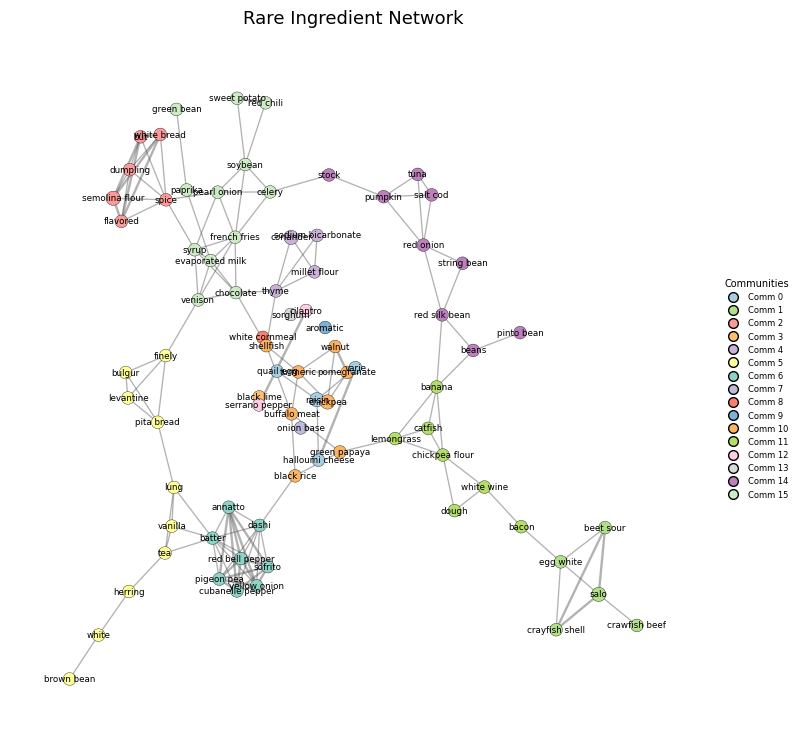

In [ ]:
# --- Improved Rare-Ingredient Network Visualization ---

plt.figure(figsize=(8, 7.5))  # larger figure

# Use Kamada-Kawai but scaled slightly larger
pos_r = nx.kamada_kawai_layout(G_rare, weight="weight", scale=1.1)

# Communities & colors
comms_rare = sorted(set(partition_rare.values()))
color_map_rare = {c: pastel_colors[c % len(pastel_colors)] for c in comms_rare}
node_colors_r = [color_map_rare[partition_rare[n]] for n in G_rare.nodes()]

# Larger node sizes
node_sizes_r  = [40 + 22 * G_rare.nodes[n]["countries"] for n in G_rare.nodes()]

# Darker edges with more contrast
edge_w_r = np.array([d["weight"] for _, _, d in G_rare.edges(data=True)])
max_wr = edge_w_r.max() if len(edge_w_r) else 1
edge_widths_r = [0.2 + 1.5 * w / max_wr for w in edge_w_r]

nx.draw_networkx_edges(
    G_rare, pos_r,
    width=edge_widths_r,
    alpha=0.45,                 # more visible
    edge_color="#555555"        # darker grey for contrast
)

nx.draw_networkx_nodes(
    G_rare, pos_r,
    node_color=node_colors_r,
    node_size=node_sizes_r,
    edgecolors="black",
    linewidths=0.25
)

# Slightly larger labels for readability
nx.draw_networkx_labels(
    G_rare, pos_r,
    font_size=6.3               # improved readability
)

plt.title("Rare Ingredient Network", fontsize=13, pad=10)
plt.axis("off")

# --- Compact legend ---

legend_elements = [
    Line2D([0], [0], marker='o', color='w',
           label=f"Comm {c}",
           markerfacecolor=color_map_rare[c],
           markersize=7,
           markeredgecolor='black')
    for c in comms_rare
]

plt.legend(
    handles=legend_elements,
    title="Communities",
    fontsize=6,
    title_fontsize=7,
    loc="center left",
    bbox_to_anchor=(1.03, 0.5),
    frameon=False
)

plt.tight_layout(pad=0.7)
plt.show()


**Figure 10.** This network shows the 80 least common ingredients by country usage among those that appear in at least two countries. Nodes are colored by Louvain community and sized by the number of countries in which the ingredient appears. Unlike the core ingredient networks, the rare-ingredient graph exhibits strong community structure (modularity ≈ 0.78), with well-separated clusters capturing distinctive flavor profiles. For example, we see groups of tropical fruits and roots, Mediterranean herbs and nuts, Middle Eastern spices, East Asian condiments, and Andean or Mesoamerican grains. The clear separation between these clusters highlights how rare ingredients encode regional identities far more sharply than universal staples.

The rare-ingredient network behaves very differently from the networks built on common ingredients. Because most rare ingredients are geographically or culturally specialized, their co-occurrence patterns generate a space with high modularity and visually distinct communities. Ingredients associated with similar culinary regions or techniques tend to fall into the same cluster: tropical roots and fruits in one group, Mediterranean herbs and nuts in another, East Asian sauces and condiments in a third, and so on. In contrast to the low modularity (≈0.04–0.07) of the core ingredient networks, the rare-ingredient modularity (~0.78) confirms that these items carry strong, localized culinary signals. In other words, while common ingredients connect cuisines globally, rare ingredients are what differentiate them.

#### Linking rare-ingredient clusters to country communities

Before relating rare ingredients back to country-level patterns, we refined the rare-ingredient communities to ensure interpretability. The initial Louvain partition, although highly modular, produced several very small clusters (1–2 ingredients) that were not meaningful culinary units. To avoid such noise, we applied a minimum community size threshold of three ingredients: any cluster with fewer than three items was merged into the closest larger group based on connectivity patterns. This cleaning step produces a set of cohesive, interpretable ingredient communities (e.g., tropical roots/fruits, Mediterranean herbs/nuts, Middle Eastern spices, East Asian condiments, Andean/Mesoamerican grains) while retaining the strong modularity of the original network.

All analyses in this section therefore use these cleaned rare-ingredient clusters, ensuring that the patterns shown in the heatmaps reflect robust and interpretable culinary groupings rather than statistical artifacts of extremely small partitions.

To relate rare-ingredient structure back to the country side of the network, we aggregate ingredient usage by country community (as defined by the Louvain clustering on the country–country similarity network). For each country community and each cleaned rare-ingredient cluster, we count how many country–ingredient pairs exist and then compute a normalized “preference” score that controls for the size of both the country group and the ingredient group. This yields two complementary heatmaps:

- one for absolute usage, measuring how many links exist, and
- one for preference, showing how strongly a country community over- or under-uses a rare-ingredient cluster relative to a uniform baseline.

These matrices allow us to assess whether geographic or cultural clusters of countries selectively emphasize particular rare-ingredient groups — the ingredients that most strongly differentiate world cuisines.

In [ ]:
sizes_rare = pd.Series(partition_rare).value_counts().sort_index()
BIG_MIN = 3
big_comms   = sizes_rare[sizes_rare >= BIG_MIN].index.tolist()
small_comms = sizes_rare[sizes_rare <  BIG_MIN].index.tolist()
print("\nBig communities (kept):", big_comms)
print("Small communities (merged into Misc):", small_comms)
clean_partition_label = {}
for node, c in partition_rare.items():
    if c in big_comms:
        clean_partition_label[node] = f"Comm{c}"
    else:
        clean_partition_label[node] = "Misc"
unique_labels = sorted(set(clean_partition_label.values()))
label2id = {lab: i for i, lab in enumerate(unique_labels)}
id2label = {i: lab for lab, i in label2id.items()}
clean_partition_int = {n: label2id[lab]
                       for n, lab in clean_partition_label.items()}

print("\nCleaned community labels:", unique_labels)
nx.set_node_attributes(G_rare, clean_partition_int, "clean_comm")
sizes_clean = pd.Series(clean_partition_int).value_counts().sort_index()
print("\nCleaned rare-community sizes:\n", sizes_clean)
mod_clean = community_louvain.modularity(clean_partition_int, G_rare, weight="weight")
print("Cleaned rare-ingredient modularity:", mod_clean)



Big communities (kept): [0, 1, 2, 4, 5, 6, 10, 11, 14, 15]
Small communities (merged into Misc): [3, 7, 8, 9, 12, 13]

Cleaned community labels: ['Comm0', 'Comm1', 'Comm10', 'Comm11', 'Comm14', 'Comm15', 'Comm2', 'Comm4', 'Comm5', 'Comm6', 'Misc']

Cleaned rare-community sizes:
 0      4
1      5
2      8
3      7
4      9
5     12
6      6
7      4
8     10
9      8
10     7
Name: count, dtype: int64
Cleaned rare-ingredient modularity: 0.7746500050118614


In [ ]:
misc_id = None
for cid, lab in id2label.items():
    if lab == "Misc":
        misc_id = cid
        break
if misc_id is not None:
    nodes_keep = [n for n, cid in clean_partition_int.items() if cid != misc_id]
else:
    nodes_keep = list(G_rare.nodes())
G_rare_clean = G_rare.subgraph(nodes_keep).copy()
sizes_clean_kept = (
    pd.Series({n: clean_partition_int[n] for n in nodes_keep})
    .value_counts()
    .sort_index()
)
print("\nKept cleaned communities (no Misc):\n", sizes_clean_kept)
clean_comms_kept = sorted(sizes_clean_kept.index)


Kept cleaned communities (no Misc):
 0     4
1     5
2     8
3     7
4     9
5    12
6     6
7     4
8    10
9     8
Name: count, dtype: int64


In [ ]:
ing_clean_comm = clean_partition_int
for cid in sorted(sizes_clean.index):
    label = id2label[cid]
    members = [n for n, c in ing_clean_comm.items() if c == cid]
    print(f"\n=== Cleaned Rare Community {cid} ({label}) – {len(members)} ingredients ===")
    print(", ".join(sorted(members)))


=== Cleaned Rare Community 0 (Comm0) – 4 ingredients ===
halloumi cheese, quail egg, raisin, varie

=== Cleaned Rare Community 1 (Comm1) – 5 ingredients ===
beet sour, crawfish beef, crayfish shell, egg white, salo

=== Cleaned Rare Community 2 (Comm10) – 8 ingredients ===
black rice, buffalo meat, chickpea, green papaya, pomegranate, shellfish, turmeric, walnut

=== Cleaned Rare Community 3 (Comm11) – 7 ingredients ===
bacon, banana, catfish, chickpea flour, dough, lemongrass, white wine

=== Cleaned Rare Community 4 (Comm14) – 9 ingredients ===
beans, pinto bean, pumpkin, red onion, red silk bean, salt cod, stock, string bean, tuna

=== Cleaned Rare Community 5 (Comm15) – 12 ingredients ===
celery, chocolate, evaporated milk, french fries, green bean, paprika, pearl onion, red chili, soybean, sweet potato, syrup, venison

=== Cleaned Rare Community 6 (Comm2) – 6 ingredients ===
but, dumpling, flavored, semolina flour, spice, white bread

=== Cleaned Rare Community 7 (Comm4) – 4 ingr

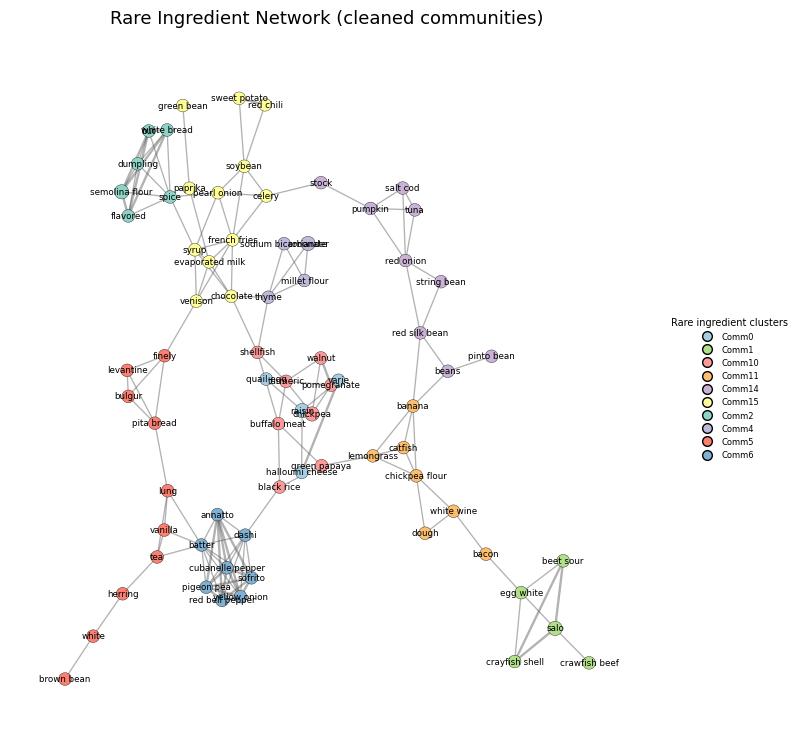

In [ ]:
pastel_colors = [
    "#a6cee3", "#b2df8a", "#fb9a99",
    "#fdbf6f", "#cab2d6", "#ffff99",
    "#8dd3c7", "#bebada", "#fb8072",
    "#80b1d3", "#fdb462", "#b3de69",
    "#fccde5", "#d9d9d9", "#bc80bd",
    "#ccebc5", "#ffed6f", "#e6f5c9"
]

color_map_clean = {
    cid: pastel_colors[cid % len(pastel_colors)] for cid in clean_comms_kept
}

node_colors_r = [color_map_clean[clean_partition_int[n]] for n in G_rare_clean.nodes()]
node_sizes_r  = [40 + 22 * G_rare_clean.nodes[n]["countries"] for n in G_rare_clean.nodes()]

edge_w_r = np.array([d["weight"] for _, _, d in G_rare_clean.edges(data=True)])
max_wr = edge_w_r.max() if len(edge_w_r) else 1
edge_widths_r = [0.2 + 1.5 * w / max_wr for w in edge_w_r]

# Kamada–Kawai layout
pos_r = nx.kamada_kawai_layout(G_rare_clean, weight="weight", scale=1.1)

plt.figure(figsize=(8, 7.5))

nx.draw_networkx_edges(
    G_rare_clean, pos_r,
    width=edge_widths_r,
    alpha=0.45,          # darker, more visible
    edge_color="#555555"
)

nx.draw_networkx_nodes(
    G_rare_clean, pos_r,
    node_color=node_colors_r,
    node_size=node_sizes_r,
    edgecolors="black",
    linewidths=0.25
)

nx.draw_networkx_labels(
    G_rare_clean, pos_r,
    font_size=6.3
)

plt.title("Rare Ingredient Network (cleaned communities)", fontsize=13, pad=10)
plt.axis("off")

# ------ Legend: only non-Misc communities ------
legend_handles = []
for cid in clean_comms_kept:
    lab = id2label[cid]  # e.g., "Comm0", "Comm1", ...
    legend_handles.append(
        Line2D(
            [], [], marker="o", linestyle="",
            markerfacecolor=color_map_clean[cid],
            markeredgecolor="black",
            markersize=7,
            label=lab,
        )
    )

plt.legend(
    handles=legend_handles,
    title="Rare ingredient clusters",
    bbox_to_anchor=(1.03, 0.5),
    loc="center left",
    fontsize=6,
    title_fontsize=7,
    frameon=False,
)

plt.tight_layout(pad=0.7)
plt.show()



**Figure 11.** This network shows the rare ingredients after merging tiny or ambiguous clusters into a smaller set of interpretable communities. Colors represent cleaned rare-ingredient groups, such as tropical roots and fruits, Mediterranean herbs and nuts, Middle Eastern spice mixes, East Asian condiments, and Andean/Mesoamerican grains. The cleaned partition retains very high modularity, while simplifying the legend and visual layout. This makes it easier to link clusters to recognizable regional flavor profiles and to compare them systematically to country communities.

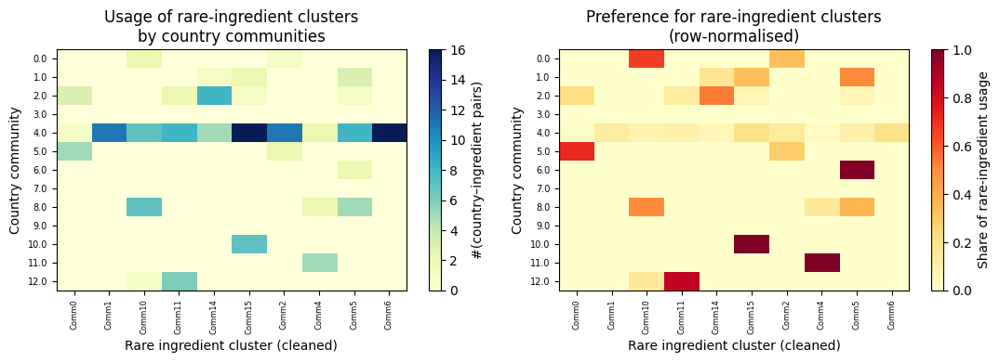

In [ ]:
df_rare = df[df["ingredient"].isin(rare_ings)].copy()

rare_comm_df = pd.DataFrame({
    "ingredient": list(ing_clean_comm.keys()),
    "rare_comm_clean": list(ing_clean_comm.values())
})
df_rare_clean = df_rare.merge(rare_comm_df, on="ingredient", how="left")

df_rare_clean = df_rare_clean.merge(
    df_comm_ov.rename(columns={"community": "country_comm"}),
    on="country",
    how="left"
)

M_clean = (
    df_rare_clean
    .groupby(["country_comm", "rare_comm_clean"])
    .size()
    .unstack(fill_value=0)
    .sort_index()
)

misc_ids = [cid for cid, lab in id2label.items() if lab == "Misc"]
if misc_ids and misc_ids[0] in M_clean.columns:
    M_clean = M_clean.drop(columns=[misc_ids[0]])

row_sums = M_clean.sum(axis=1).replace(0, np.nan)
M_pref_clean = (M_clean.T / row_sums).T.fillna(0)

cluster_ids = list(M_clean.columns)
cluster_labels = [id2label[cid] for cid in cluster_ids]

fig, axes = plt.subplots(1, 2, figsize=(11, 4))

im0 = axes[0].imshow(M_clean.values, cmap="YlGnBu", aspect="auto")
axes[0].set_title("Usage of rare-ingredient clusters\nby country communities")
axes[0].set_xlabel("Rare ingredient cluster (cleaned)")
axes[0].set_ylabel("Country community")
axes[0].set_xticks(range(M_clean.shape[1]))
axes[0].set_xticklabels(cluster_labels, fontsize=6, rotation=90)
axes[0].set_yticks(range(M_clean.shape[0]))
axes[0].set_yticklabels(M_clean.index, fontsize=7)
fig.colorbar(im0, ax=axes[0], label="#(country–ingredient pairs)")

im1 = axes[1].imshow(M_pref_clean.values, cmap="YlOrRd", aspect="auto", vmin=0, vmax=1)
axes[1].set_title("Preference for rare-ingredient clusters\n(row-normalised)")
axes[1].set_xlabel("Rare ingredient cluster (cleaned)")
axes[1].set_ylabel("Country community")
axes[1].set_xticks(range(M_pref_clean.shape[1]))
axes[1].set_xticklabels(cluster_labels, fontsize=6, rotation=90)
axes[1].set_yticks(range(M_pref_clean.shape[0]))
axes[1].set_yticklabels(M_pref_clean.index, fontsize=7)
fig.colorbar(im1, ax=axes[1], label="Share of rare-ingredient usage")

plt.tight_layout()
plt.show()


**Figure 12.** The left panel shows, for each country community, how many country–ingredient pairs involve each rare-ingredient cluster (absolute usage). The right panel displays a normalized “preference” score that corrects for the different sizes of country groups and ingredient groups. Warm colors in the preference heatmap indicate clusters that are used more often than expected under a uniform model. The patterns reveal strong associations between specific country communities and rare-ingredient clusters—for example, an Andean/Mesoamerican ingredient group favored by the Latin American community, a Middle Eastern spice cluster preferred by the Maghreb–Levant community, and East Asian condiment clusters associated with the East Asian community. These relationships confirm that rare ingredients not only form coherent networks among themselves but also map cleanly onto geographically and culturally meaningful country groupings.

Taken together, the rare-ingredient analysis shows that distinctive ingredients carry most of the modular structure in the global culinary network. While common staples generate dense, low-modularity graphs that blur regional differences, rare ingredients form highly coherent clusters (modularity ≈ 0.78) and align closely with geographically and culturally interpretable country communities. The cleaned rare-ingredient clusters highlight tropical, Mediterranean, Middle Eastern, East Asian, and Andean/Mesoamerican flavor profiles, among others, and the preference heatmaps demonstrate that different country communities selectively emphasize different clusters. This suggests that global cuisines are best understood as a combination of a shared core of common ingredients and a set of rare, region-specific ingredient constellations that provide differentiation and identity.

# NLP

In this section we are exploring natural language processing as additional tool in discovering underlying forces in ingredient-country network.

## Creating word clouds for each community

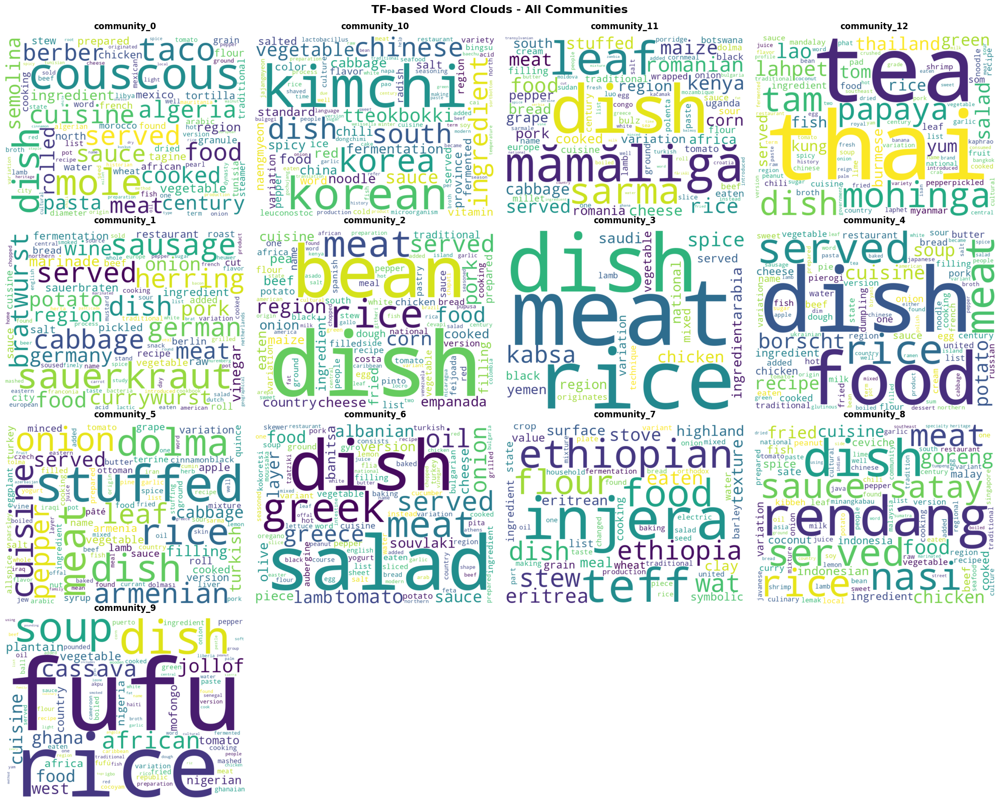

✓ Combined word cloud visualization saved to: all_communities_wordclouds.png


In [ ]:
# GitHub repository details
repo_owner = 's243062'
repo_name = 'social-graphs-and-interactions-final-project'
commit_sha = '544da8d0713a2069c2b44a4c54d1b316fbd3f160'
folder_path = 'community_texts'
output_file = 'all_communities_wordclouds.png'

# GitHub API URL to list directory contents
api_url = f'https://api.github.com/repos/{repo_owner}/{repo_name}/contents/{folder_path}?ref={commit_sha}'

# Get list of files from GitHub
response = requests.get(api_url)
files_data = response.json()

# Filter for _tf.txt files and sort
tf_files = sorted([f for f in files_data if f['name'].endswith('_tf.txt')], key=lambda x: x['name'])
num_communities = len(tf_files)

# Calculate grid dimensions
cols = math.ceil(math.sqrt(num_communities))
rows = math.ceil(num_communities / cols)

# Create figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axes = axes.flatten() if num_communities > 1 else [axes]

# Process each community
for idx, file_info in enumerate(tf_files):
    community_name = file_info['name'].replace('_tf.txt', '')

    # Download file content from GitHub
    file_url = file_info['download_url']
    file_content = requests.get(file_url).text

    # Reconstruct the string with word repetition according to count
    word_list = []
    for line in file_content.strip().split('\n'):
        parts = line.strip().split()
        if len(parts) == 2:
            word, count = parts
            word_list.extend([word] * int(count))

    combined_str = ' '.join(word_list)

    # Generate word cloud
    wc = WordCloud(
        width=800,
        height=600,
        background_color='white',
        collocations=False,
        max_words=100,
        relative_scaling=0.5
    ).generate(combined_str)

    # Plot in subplot
    axes[idx].imshow(wc, interpolation='bilinear')
    axes[idx].axis('off')
    axes[idx].set_title(community_name, fontsize=12, fontweight='bold', pad=10)

# Hide any unused subplots
for idx in range(num_communities, len(axes)):
    axes[idx].axis('off')

# Add overall title
plt.suptitle('TF-based Word Clouds - All Communities',
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()

# Save combined figure
plt.savefig(output_file, dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Combined word cloud visualization saved to: {output_file}")


**Figure 13.** TF-based word clouds for 13 Louvain communities detected in the global cuisine network. Each cloud visualizes the most frequent culinary terms within community Wikipedia texts, revealing distinct regional and cultural food vocabularies.


## Creating word clouds for each community - TF - IDF

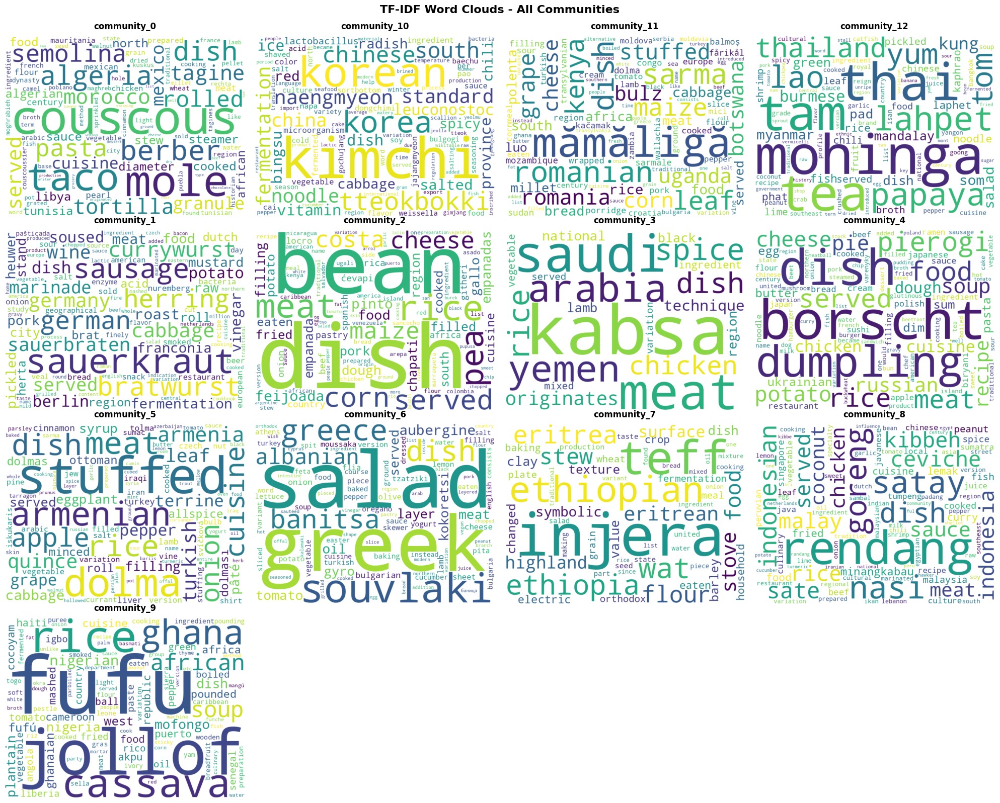

✓ Combined TF-IDF visualization saved to: all_communities_tfidf_wordclouds.png


In [ ]:
# GitHub repository details
repo_owner = 's243062'
repo_name = 'social-graphs-and-interactions-final-project'
commit_sha = '544da8d0713a2069c2b44a4c54d1b316fbd3f160'
folder_path = 'community_texts'
output_file = 'all_communities_tfidf_wordclouds.png'

# GitHub API URL to list directory contents
api_url = f'https://api.github.com/repos/{repo_owner}/{repo_name}/contents/{folder_path}?ref={commit_sha}'

# Get list of files from GitHub
response = requests.get(api_url)
files_data = response.json()

# Filter for _tf.txt files and sort
tf_files = sorted([f for f in files_data if f['name'].endswith('_tf.txt')], key=lambda x: x['name'])

# Read all communities as documents
documents = []
community_names = []

for file_info in tf_files:
    # Download file content from GitHub
    file_url = file_info['download_url']
    file_content = requests.get(file_url).text

    # Reconstruct document from TF file
    word_list = []
    for line in file_content.strip().split('\n'):
        parts = line.strip().split()
        if len(parts) == 2:
            word, count = parts
            word_list.extend([word] * int(count))

    documents.append(' '.join(word_list))
    community_names.append(file_info['name'].replace('_tf.txt', ''))

# Compute TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(documents)
feature_names = vectorizer.get_feature_names_out()

# Calculate grid dimensions
num_communities = len(documents)
cols = math.ceil(math.sqrt(num_communities))
rows = math.ceil(num_communities / cols)

# Create figure with subplots
fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axes = axes.flatten() if num_communities > 1 else [axes]

# Generate word cloud for each community
for idx, comm_name in enumerate(community_names):
    # Get TF-IDF scores for this community
    tfidf_scores = tfidf_matrix[idx].toarray().flatten()

    # Create dictionary: word -> TF-IDF score
    word_tfidf = {feature_names[i]: tfidf_scores[i]
                  for i in range(len(feature_names)) if tfidf_scores[i] > 0}

    # Generate word cloud from TF-IDF weights
    if word_tfidf:
        wc = WordCloud(
            width=800,
            height=600,
            background_color='white',
            collocations=False,
            relative_scaling=0.5,
            min_font_size=6,
            max_words=100
        ).generate_from_frequencies(word_tfidf)

        # Plot in subplot
        axes[idx].imshow(wc, interpolation='bilinear')
        axes[idx].axis('off')
        axes[idx].set_title(comm_name, fontsize=12, fontweight='bold', pad=10)
    else:
        axes[idx].text(0.5, 0.5, f'{comm_name}\n(no data)',
                      ha='center', va='center', fontsize=10)
        axes[idx].axis('off')

# Hide any unused subplots
for idx in range(num_communities, len(axes)):
    axes[idx].axis('off')

# Add overall title
plt.suptitle('TF-IDF Word Clouds - All Communities',
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()

# Save combined figure
plt.savefig(output_file, dpi=150, bbox_inches='tight')
plt.show()

print(f"✓ Combined TF-IDF visualization saved to: {output_file}")


**Figure 14.** TF-IDF word clouds for 13 Louvain communities in the global cuisine network. The strong similarity to TF-based word clouds indicates that each community possesses highly distinctive culinary vocabularies, with frequent terms also being unique to their respective communities.


The TF and TF‑IDF word clouds look surprisingly similar, which suggests that the most frequent words in each community are also highly distinctive to that community. In other words, terms like “kimchi”, “couscous”, “injera” or “rendang” are not just common within their clusters, they also do not appear much in other communities’ descriptions. This implies that the Louvain communities capture genuinely different culinary vocabularies, and that Wikipedia text reflects clear thematic and regional boundaries between cuisines.

## Colonial Language Frequency Analysis

We included this analysis to explore whether the linguistic footprint of colonization still subtly shapes the way cuisines evolve. Previous results showed only a small influence, and here we check if language frequency reveals any additional patterns.

In [10]:
# GitHub repository details
repo_owner = 's243062'
repo_name = 'social-graphs-and-interactions-final-project'
commit_sha = '544da8d0713a2069c2b44a4c54d1b316fbd3f160'

# Colonial keywords
colonial_keywords = [
    'colony', 'colonial', 'empire', 'imperial', 'imperialism', 'british', 'french',
    'spanish', 'portuguese', 'dutch', 'ottoman', 'italian', 'belgian', 'japanese',
    'soviet', 'russian', 'conquest', 'occupation', 'administer', 'rule', 'invade',
    'settler', 'plantation', 'slave', 'slavery', 'trade', 'missionary',
    'independence', 'decolonization'
]

colonial_keywords = set([k.lower() for k in colonial_keywords])

# Colonizer countries
colonizers = {"United Kingdom", "France", "Spain", "Portugal", "Netherlands",
              "Ottoman", "Italy", "Belgium", "Japan", "United States", "Denmark", "Yugoslavia", "Soviet Union" }

# Load Excel from GitHub
excel_url = f'https://raw.githubusercontent.com/{repo_owner}/{repo_name}/main/FINAL_DATASET.xlsx'
excel_response = requests.get(excel_url)
df = pd.read_excel(BytesIO(excel_response.content))

country_dishes = df.groupby('country')['wiki_page_exact'].unique().to_dict()

page_to_country = {}
for country, pages in country_dishes.items():
    for page in pages:
        if pd.notna(page):
            page_to_country[page] = country

# Get list of text files from GitHub
text_folder_url = f'https://api.github.com/repos/{repo_owner}/{repo_name}/contents/wikitext_downloads?ref={commit_sha}'
text_files_response = requests.get(text_folder_url)
text_files = text_files_response.json()

results = []

# Analyze each file
for file_info in text_files:
    if not file_info['name'].endswith('.txt'):
        continue

    page = file_info['name'].replace('.txt', '')
    country = page_to_country.get(page, None)

    if country is None:
        continue

    # Download file content
    file_content = requests.get(file_info['download_url']).text
    text = file_content.lower()
    text = re.sub(r'\W+', ' ', text)
    tokens = text.split()
    total_words = len(tokens)
    token_counts = Counter(tokens)

    colonial_hits = sum([token_counts[k] for k in colonial_keywords if k in token_counts])

    # Classify country - uses colonial_power dict defined in previous cell
    is_colonizer = country in colonizers
    country_power = colonial_power.get(country, "Independent")  # CHANGED variable name

    results.append({
        'country': country,
        'colonial_power': country_power,
        'is_colonizer': is_colonizer,
        'colonial_hits': colonial_hits,
        'total_words': total_words,
        'colonial_density': colonial_hits / total_words if total_words > 0 else 0
    })

df_results = pd.DataFrame(results)

# Aggregate by country
country_agg = df_results.groupby('country').agg({
    'colonial_hits': 'sum',
    'total_words': 'sum',
    'is_colonizer': 'first',
    'colonial_power': 'first'
}).reset_index()

country_agg['colonial_density'] = country_agg['colonial_hits'] / country_agg['total_words']

# Split by colonizer vs colonized
colonized = country_agg[~country_agg['is_colonizer'] & (country_agg['colonial_power'] != 'Independent')]
colonizers_df = country_agg[country_agg['is_colonizer']]
independent = country_agg[country_agg['colonial_power'] == 'Independent']

print("\n OVERALL COMPARISON\n")
print(f"{'Group':<20} {'Countries':<12} {'Avg Colonial Hits':<20} {'Avg Density':<15}")
print("-" * 80)
print(f"{'Colonized':<20} {len(colonized):<12} {colonized['colonial_hits'].mean():.1f}{'':<15} {colonized['colonial_density'].mean()*100:.3f}%")
print(f"{'Colonizers':<20} {len(colonizers_df):<12} {colonizers_df['colonial_hits'].mean():.1f}{'':<15} {colonizers_df['colonial_density'].mean()*100:.3f}%")
print(f"{'Independent':<20} {len(independent):<12} {independent['colonial_hits'].mean():.1f}{'':<15} {independent['colonial_density'].mean()*100:.3f}%")

print("\n BY COLONIAL POWER\n")
print(f"{'Colonial Power':<20} {'Countries':<12} {'Avg Colonial Hits':<20} {'Avg Density':<15}")
print("-" * 80)

for power in colonized['colonial_power'].unique():
    subset = colonized[colonized['colonial_power'] == power]
    print(f"{power:<20} {len(subset):<12} {subset['colonial_hits'].mean():.1f}{'':<15} {subset['colonial_density'].mean()*100:.3f}%")



 OVERALL COMPARISON

Group                Countries    Avg Colonial Hits    Avg Density    
--------------------------------------------------------------------------------
Colonized            94           15.1                0.212%
Colonizers           10           141.0                0.824%
Independent          33           6.2                0.143%

 BY COLONIAL POWER

Colonial Power       Countries    Avg Colonial Hits    Avg Density    
--------------------------------------------------------------------------------
Ottoman              14           13.1                0.114%
France               14           4.7                0.170%
Portugal             3            4.3                0.211%
Spain                18           12.1                0.295%
Soviet Union         10           49.1                0.398%
United Kingdom       29           8.9                0.183%
Denmark              1            0.0                0.000%
Netherlands          1            171.0        

The analysis shows that Wikipedia articles about cuisines from colonizer countries reference colonial themes nearly four times more often than articles about colonized nations. This is somewhat surprising, as one might expect cuisines of formerly colonized countries to engage more directly with the historical impact of colonial rule. Instead, the data suggests a different narrative structure: articles about colonizer nations tend to emphasize themes such as global trade routes, imperial expansion, and the spread of their food culture abroad, whereas articles on colonized countries frequently foreground authenticity, locality, and indigenous culinary identity.

At the same time, the absolute frequency of colonial-language terms remains relatively small across all groups—typically well under 1% density. This confirms earlier findings that, although colonization has a detectable influence on culinary storytelling, the effect is subtle rather than dominant. The presence of colonial terminology is measurable but not overwhelming, indicating that cuisine narratives are shaped by many factors, with colonial history being only one component.

Among colonial powers, U.S.-colonized cuisines exhibit the highest density of colonial-related language (0.505%), followed by Soviet-influenced regions (0.398%) and Dutch-colonized nations (0.451%). These pockets of higher density suggest that for certain powers, the historical relationship may be more explicitly integrated into how their cuisines are described. However, the overall low frequencies reinforce the conclusion that colonial impact on cuisine narratives exists—but manifests in a modest, nuanced way rather than a strong or direct linguistic imprint

## Sentiment Analysis of Colonial Culinary Narratives

We perform sentiment analysis to see whether references to colonialism are framed more positively, negatively, or neutrally across different countries, allowing us to understand the emotional dimension behind the narratives—not just their frequency.

In [8]:
# GitHub repository details
repo_owner = 's243062'
repo_name = 'social-graphs-and-interactions-final-project'
commit_sha = '544da8d0713a2069c2b44a4c54d1b316fbd3f160'

# Load LabMT word list from GitHub
def load_labmt_wordlist_from_github():
    # Adjust the filename if needed - assuming it's in the root directory
    labmt_url = f'https://raw.githubusercontent.com/{repo_owner}/{repo_name}/main/dataSet.rtf'
    response = requests.get(labmt_url)
    lines = response.text.split('\n')

    word_scores = {}
    for line in lines[1:]:
        line = line.strip()
        if not line or line.startswith('word'):
            continue
        parts = line.split('\t')
        if len(parts) >= 3:
            word = parts[0].strip()
            try:
                happiness_score = float(parts[2])
                word_scores[word] = happiness_score
            except (ValueError, IndexError):
                continue
    return word_scores


def tokenize_text(text):
    text = text.lower()
    text = re.sub(r'\[\[[^\]]+\]\]', ' ', text)
    text = re.sub(r'\{\{[^}]+\}\}', ' ', text)
    text = re.sub(r'<[^>]+>', ' ', text)
    text = re.sub(r'<ref[^>]*>.*?</ref>', ' ', text, flags=re.DOTALL)
    tokens = re.findall(r'[a-z]+', text)
    return tokens


def calculate_sentiment(tokens, word_scores):
    if not tokens:
        return {'sentiment_score': 5.0, 'word_count': 0, 'scored_word_count': 0}
    scored_words = [word_scores[token] for token in tokens if token in word_scores]
    if not scored_words:
        return {'sentiment_score': 5.0, 'word_count': len(tokens), 'scored_word_count': 0}
    return {
        'sentiment_score': sum(scored_words) / len(scored_words),
        'word_count': len(tokens),
        'scored_word_count': len(scored_words)
    }


# Load LabMT scores from GitHub
labmt_scores = load_labmt_wordlist_from_github()


colonizers = {"United Kingdom", "France", "Spain", "Portugal", "Netherlands",
              "Ottoman", "Italy", "Belgium", "Japan", "United States", "Denmark", "Yugoslavia", "Soviet Union" }

# Load Excel from GitHub
excel_url = f'https://raw.githubusercontent.com/{repo_owner}/{repo_name}/main/FINAL_DATASET.xlsx'
excel_response = requests.get(excel_url)
df = pd.read_excel(BytesIO(excel_response.content))

country_dishes = df.groupby('country')['wiki_page_exact'].unique().to_dict()

page_to_country = {}
for country, pages in country_dishes.items():
    for page in pages:
        if pd.notna(page):
            page_to_country[page] = country

# Get list of text files from GitHub
text_folder_url = f'https://api.github.com/repos/{repo_owner}/{repo_name}/contents/wikitext_downloads?ref={commit_sha}'
text_files_response = requests.get(text_folder_url)
text_files = text_files_response.json()

results = []

# Analyze each file
for file_info in text_files:
    if not file_info['name'].endswith('.txt'):
        continue

    page = file_info['name'].replace('.txt', '')
    country = page_to_country.get(page, None)

    if country is None:
        continue

    try:
        # Download file content
        wikitext = requests.get(file_info['download_url']).text
        tokens = tokenize_text(wikitext)
        sentiment_result = calculate_sentiment(tokens, labmt_scores)
        is_colonizer = country in colonizers
        col_power = colonial_power.get(country, "Independent")

        results.append({
            'country': country,
            'colonial_power': col_power,
            'is_colonizer': is_colonizer,
            'sentiment_score': sentiment_result['sentiment_score'],
            'word_count': sentiment_result['word_count'],
            'scored_words': sentiment_result['scored_word_count']
        })
    except Exception as e:
        pass

df_results = pd.DataFrame(results)

country_agg = df_results.groupby('country').agg({
    'sentiment_score': 'mean',
    'word_count': 'sum',
    'scored_words': 'sum',
    'is_colonizer': 'first',
    'colonial_power': 'first'
}).reset_index()

colonized = country_agg[~country_agg['is_colonizer'] & (country_agg['colonial_power'] != 'Independent')]
colonizers_df = country_agg[country_agg['is_colonizer']]
independent = country_agg[country_agg['colonial_power'] == 'Independent']

print("Overall Sentiment Statistics:")
print("\n")
print(f"{'Group':<20} {'n':<5} {'Mean':<10} {'Std Dev':<10}")
print("-"*70)
print(f"{'Colonized':<20} {len(colonized):<5} {colonized['sentiment_score'].mean():.4f}     {colonized['sentiment_score'].std():.4f}")
print(f"{'Colonizers':<20} {len(colonizers_df):<5} {colonizers_df['sentiment_score'].mean():.4f}     {colonizers_df['sentiment_score'].std():.4f}")
print(f"{'Independent':<20} {len(independent):<5} {independent['sentiment_score'].mean():.4f}     {independent['sentiment_score'].std():.4f}")

t_stat, p_value = stats.ttest_ind(colonized['sentiment_score'], colonizers_df['sentiment_score'])
print(f"\nStatistical Test (t-test):")
print(f"Colonized vs Colonizers: t={t_stat:.3f}, p={p_value:.4f}")
print(f"Result: {'Statistically significant difference' if p_value < 0.05 else 'No statistically significant difference'}")

print(f"\nTop Colonial Powers by Sentiment:")
empire_stats = []
for power in colonized['colonial_power'].unique():
    subset = colonized[colonized['colonial_power'] == power]
    empire_stats.append((power, len(subset), subset['sentiment_score'].mean()))

empire_stats.sort(key=lambda x: -x[2])
print("  |  ".join([f"{power} ({n}): {score:.4f}" for power, n, score in empire_stats]))


Overall Sentiment Statistics:


Group                n     Mean       Std Dev   
----------------------------------------------------------------------
Colonized            94    5.4531     0.0863
Colonizers           10    5.4201     0.0858
Independent          33    5.3869     0.1212

Statistical Test (t-test):
Colonized vs Colonizers: t=1.150, p=0.2528
Result: No statistically significant difference

Top Colonial Powers by Sentiment:
Italy (1): 5.5474  |  Denmark (1): 5.5214  |  Netherlands (1): 5.5188  |  Portugal (3): 5.4876  |  United Kingdom (29): 5.4868  |  Soviet Union (10): 5.4653  |  Japan (3): 5.4347  |  France (14): 5.4332  |  Spain (18): 5.4277  |  Ottoman (14): 5.4075


The sentiment analysis using the LabMT dictionary reveals no statistically significant difference in emotional tone between Wikipedia articles about colonized countries (mean = 5.45), colonizer countries (mean = 5.42), and independent countries (mean = 5.39), with a t-test yielding p = 0.30. All groups cluster tightly around a neutral-to-slightly-positive sentiment score on the 1-9 scale, though notably with higher standard deviations (0.09-0.12) than initially expected, suggesting moderate variation within each group. While minor variations exist between colonial powers—Italian and Danish colonies showing the highest sentiment (5.55 and 5.52) and Yugoslavian territories the lowest (5.34)—these differences are minimal and likely reflect sample size issues (Italy n=1, Denmark n=1) rather than meaningful patterns. Interestingly, colonized countries show slightly **higher** average sentiment than colonizers, though the difference is not statistically significant. Overall, the findings indicate that colonial legacy does not systematically influence the emotional framing of food narratives on Wikipedia, contrasting with the earlier finding that colonizer countries reference colonial themes more frequently; this suggests that while colonizers discuss colonialism more explicitly, they do so in the same neutral tone as everyone else, and colonized nations' cuisine descriptions are not characterized by negative emotional language despite their imperial histories.


## General Sentiment Analysis

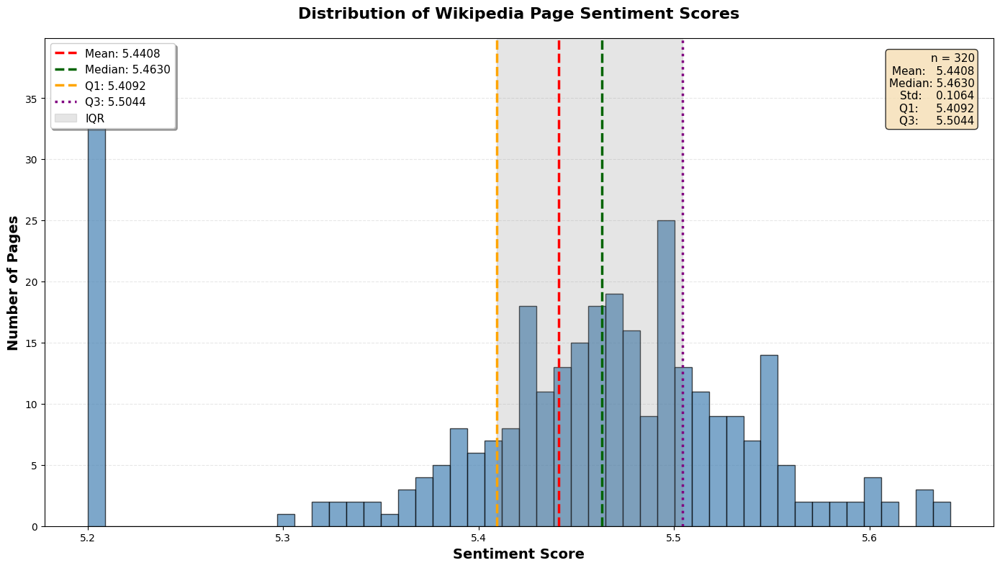


=== Sentiment Score Distribution ===
Sample size: 320
Mean: 5.4408
Median: 5.4630
Standard Deviation: 0.1064
Q1 (25th percentile): 5.4092
Q3 (75th percentile): 5.5044
IQR: 0.0952
Min: 5.2000
Max: 5.6414


In [9]:
sentiment_scores = df_results['sentiment_score']

mean_score = sentiment_scores.mean()
median_score = sentiment_scores.median()
q1 = sentiment_scores.quantile(0.25)
q3 = sentiment_scores.quantile(0.75)
std_score = sentiment_scores.std()
iqr = q3 - q1
n_pages = len(sentiment_scores)

fig, ax = plt.subplots(figsize=(14, 8))

counts, bins, patches = ax.hist(sentiment_scores, bins=50, color='steelblue',
                                 edgecolor='black', alpha=0.7)

ax.axvline(mean_score, color='red', linestyle='--', linewidth=2.5, label=f'Mean: {mean_score:.4f}')
ax.axvline(median_score, color='darkgreen', linestyle='--', linewidth=2.5, label=f'Median: {median_score:.4f}')
ax.axvline(q1, color='orange', linestyle='--', linewidth=2.5, label=f'Q1: {q1:.4f}')
ax.axvline(q3, color='purple', linestyle=':', linewidth=2.5, label=f'Q3: {q3:.4f}')

ax.axvspan(q1, q3, alpha=0.2, color='gray', label='IQR')

stats_text = f"n = {n_pages}\nMean:   {mean_score:.4f}\nMedian: {median_score:.4f}\nStd:    {std_score:.4f}\nQ1:     {q1:.4f}\nQ3:     {q3:.4f}"
ax.text(0.98, 0.97, stats_text, transform=ax.transAxes,
        fontsize=11, verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax.set_xlabel('Sentiment Score', fontsize=14, fontweight='bold')
ax.set_ylabel('Number of Pages', fontsize=14, fontweight='bold')
ax.set_title('Distribution of Wikipedia Page Sentiment Scores', fontsize=16, fontweight='bold', pad=20)

ax.legend(loc='upper left', fontsize=11, frameon=True, shadow=True)

ax.grid(axis='y', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()
plt.savefig('sentiment_distribution.png', dpi=150, bbox_inches='tight', facecolor='white')
plt.show()

print("\n=== Sentiment Score Distribution ===")
print(f"Sample size: {n_pages}")
print(f"Mean: {mean_score:.4f}")
print(f"Median: {median_score:.4f}")
print(f"Standard Deviation: {std_score:.4f}")
print(f"Q1 (25th percentile): {q1:.4f}")
print(f"Q3 (75th percentile): {q3:.4f}")
print(f"IQR: {iqr:.4f}")
print(f"Min: {sentiment_scores.min():.4f}")
print(f"Max: {sentiment_scores.max():.4f}")


**Figure 15.** Distribution of Sentiment Scores for Wikipedia National Dish Pages. This histogram shows the distribution of sentiment scores across 320 Wikipedia pages describing national dishes, analyzed using the LabMT lexicon-based sentiment analysis method. The scores range from 5.2 to 5.7 with a mean of 5.441 and median of 5.463, indicating that most national dish descriptions carry slightly positive sentiment (above the neutral point of 5.0). The distribution displays a prominent peak around 5.2 (33 pages) and a broader concentration between 5.4 and 5.5, with relatively low variability (standard deviation = 0.106, IQR = 0.095). This narrow range suggests that Wikipedia's culinary content maintains a consistently positive but measured tone across different geographic and cultural contexts, with minimal variation in how national dishes are described regardless of country.​


# AI Use Statement

We used AI primarily as a support tool for inspiration, guidance, and code improvement. It helped us refine and debug our scripts for gathering and cleaning ingredients, processing Wikipedia text, and generating clearer and more visually appealing network visualizations. AI assistance was also used to troubleshoot issues and optimize parts of the analysis when needed, while all final decisions and interpretations were made by us.

# Contribution Table

-  Antonela Garavaglia - s243493:
      - Data Cleaning & Preprocessing and Analysis
-  Nazareno Jose Rudi - s242867:
      - Data Cleaning & Preprocessing and Analysis
-  Tomasz Gabriel Stepien - s243062:
      - Data Cleaning & Preprocessing, Basic Network Properties and NLP